**OpenBlas may create problems, see below before starting jupyter session**

In [12]:
#!!!! May need to curb OpenBlas threads !!!! (Only once per session)
#export OMP_NUM_THREADS=1 (run directly in command line, not from jupyter notebook)

In [ ]:
# # Code to fix redundant cell ids from copy/paste between notebooks

# import nbformat as nbf
# from glob import glob

# import uuid
# def get_cell_id(id_length=8):
#     return uuid.uuid4().hex[:id_length]

# # your notebook name/keyword
# nb_name = 'tc'
# notebooks = list(filter(lambda x: nb_name in x, glob("./*.ipynb", recursive=True)))

# # iterate over notebooks
# for ipath in sorted(notebooks):
#     # load notebook
#     ntbk = nbf.read(ipath, nbf.NO_CONVERT)
    
#     cell_ids = []
#     for cell in ntbk.cells:
#         if 'metadata' in cell and 'id' in cell['metadata']:
#             cell_ids.append(cell['metadata']['id'])

#     # reset cell ids if there are duplicates
#     if not len(cell_ids) == len(set(cell_ids)): 
#         for cell in ntbk.cells:
#             cell['metadata']['id'] = get_cell_id()

#     nbf.write(ntbk, ipath)

# Markov chains for length bias quantification in scRNA-seq: a Colab demonstration

In this notebook, we illustrate a Markov chain approach for joint probabilistic description of technical and biological noise in scRNA-seq.

We implement a [conventional two-stage model](https://www.sciencedirect.com/science/article/pii/S0006349512007904?via%3Dihub) for the living cell dynamics. Unspliced mRNA transcripts are produced in geometric bursts. These unspliced transcripts are spliced, then degraded. After equilibration, the sequencing process starts, halting all biological processes. The cDNA library construction is a pure-birth process: it yields $Poisson(\lambda_u)$ *in silico* UMIs for each unspliced mRNA and $Poisson(\lambda_s)$ UMIs for each spliced mRNA.

We use a length-dependent model of UMI capture. Specifically, we posit that $\lambda_u = C_u L$, where $L$ is the length of the full gene: longer genes have more poly(A) stretches that can be captured by the oligo(dT) primers used in scRNA-seq. On the other hand, $\lambda_s$ is presumed constant across all genes: spliced transcripts are primarily captured at the poly(A) tail appended before nuclear export.

We scan over a grid of $\{C_u, \lambda_s\}$ values, compute the conditional maximum likelihood estimates for the biological parameters, identify a sampling parameter optimum, and investigate parameter trends and fit quality. 

In [1]:
from datetime import date
import time
t1 = time.time()

## Prerequisites

First, install the necessary numerical differentiation, parallelization, and `loom` file import packages.

In [ ]:
# !pip -q install numdifftools 
# !pip -q install parfor
# !pip -q install loompy

     |████████████████████████████████| 99 kB 4.3 MB/s 
     |████████████████████████████████| 189 kB 38.7 MB/s 
     |████████████████████████████████| 41 kB 123 kB/s 
     |████████████████████████████████| 48 kB 4.6 MB/s 


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
import warnings
warnings.filterwarnings("ignore")

Clone the project GitHub repository to collect the data and processing scripts.

In [4]:
!git clone https://github.com/tarachari3/GP_2021_3.git

fatal: destination path 'seq-cme-technoise' already exists and is not an empty directory.


In [5]:
!mv GP_2021_3/* .
#!rm -r seq-cme-technoise

In [6]:
!mv polyA_ref/* .

In [4]:
# Can add this function later to seq_cme_inference
# Write input txt file

def genRunInput(fname='example_input.txt',dataDir = './',outDir='./',loomName = '',tranName = '',polyaA='15',tInd='0',
                filt='0.01, 0.01, 350, 350, 3, 3',exclude='',attList="[['spliced','unspliced','Gene','Barcode']]",
                seed='42', nGenes='5000', ind='0', gList='', lb='-2, -1.8, -1.8', ub='4.2, 2.5, 2.5',
                restart='1',init='moments',length='True',niter='20',nCu='10',nlambda='11',
                lbSamp='-9, -4',ubSamp='-4, 1.5',suffix='1',creator='tc',ncor='20',override=''):
    '''
    Generate run file for CME inference procedure. 
    Parameters listed in order of appearance in run text file.
    For a dry-run set ind = '-1'.

    Parameters:
    fname: filepath for run file
    dataDir: filepath for data directory
    outDir: filepath for output directory
    loomName: loom filenames
    tranName: transcriptome filepath
    polyaA: min polyA count
    tInd: column of transcriptome file (lengths if 0, polyA count if 1)
    filt: min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S
    exclude:  result files (with genes to exclude)
    attList: list of lists for loom attribute names
    seed: gene selection seed
    nGenes: number of genes to select
    ind: loom file to analyze
    gList: result files to use for gene names
    lb: log10 of lower bound on burst size, splice rate, degradation rate
    ub: upper bound on on burst size, splice rate, degradation rate
    restart: how many times to run the search for each gene
    init: method to start search; 'random' if nothing
    length: use gene length for Poisson sampling
    niter: max iterations of gradient descent
    nCu: number of C_u points to evaluate
    nlambda: number of lambda_s points to evalute
    lbSamp: lower limits of C_u and lambda_s
    ubSamp: upper limits of C_u and lambda_s
    suffix: folder directory suffix
    creator: directory creator name
    ncor: number of cores to use
    override: if empty, use today's date from computer, else use string provided

    Returns:
    Run file (txt)
    '''

    with open(fname, 'w') as f:
        f.write('#Parameter input for CME inference ')
        f.write('\n')
        f.write('dataset_directory : '+dataDir+' : folder with dataset loom files')
        f.write('\n')
        f.write('result_directory : '+outDir+' : where to put the result folder')
        f.write('\n')
        f.write('loom_filenames : '+loomName+' : filenames to integrate')
        f.write('\n')
        f.write('transcriptome_filename : '+tranName+' : transcriptome location')
        f.write('\n')
        f.write('polyA_threshold : '+polyaA+' : minimum polyA count to use for sampling function')
        f.write('\n')
        f.write('transcriptome_ind : '+tInd+' : column of transcriptome file to use (lengths if 0, polyA count if 1)')
        f.write('\n')
        f.write('filter_param : '+filt+' : min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S')
        f.write('\n')
        f.write('all_prev_results : '+exclude+': result files with gene names to exclude')
        f.write('\n')
        f.write('attribute_names : '+attList+' : list or list of lists with loom attribute names')
        f.write('\n')
        f.write('gene_sel_seed : '+seed+' : gene selection seed')
        f.write('\n')
        f.write('n_gen : '+nGenes+' : number of genes to select')
        f.write('\n')
        f.write('IND : '+ind+' : loom_filename to analyze')
        f.write('\n')
        f.write('gene_list : '+gList+' : set of result files to import to define gene names')
        f.write('\n')
        f.write('phys_lb : '+lb+' : log10 of lower bound on burst size, splice rate, degradation rate')
        f.write('\n')
        f.write('phys_ub : '+ub+' : upper bound on same')
        f.write('\n')
        f.write('search_restarts : '+restart+' : how many times to run the search for each gene')
        f.write('\n')
        f.write("init_pattern : "+init+" : whether to start the search using method of moments estimate or not; 'random' if not")
        f.write('\n')
        f.write('use_lengths : '+length+' : whether the Poisson sampling for unspliced mRNA should depend on gene length')
        f.write('\n')
        f.write('maxiter : '+niter+' : number of iterations of gradient descent to perform')
        f.write('\n')
        f.write('n_pt1 : '+nCu+' : number of C_u points to evaluate')
        f.write('\n')
        f.write('n_pt2 : '+nlambda+' : number of lambda_s points to evalute')
        f.write('\n')
        f.write('samp_lb : '+lbSamp+' : lower limits of C_u and lambda_s')
        f.write('\n')
        f.write('samp_ub : '+ubSamp+' : upper limits of C_u and lambda_s')
        f.write('\n')
        f.write('ID_suffix : '+suffix+' : folder directory suffix')
        f.write('\n')
        f.write('creator : '+creator+' : directory creator name, can also be used for generic metadata')
        f.write('\n')
        f.write('NCOR : '+ncor+' : number of cores to use')
        f.write('\n')
        f.write("date_override : "+override+": if empty, use today's date from computer. if not, use the given string")




In [5]:
# a e s t h e t i c s

#all
col_gold = [203/255,197/255,149/255]
col_gray = [116/255,112/255,113/255]
col_red = [212/255,107/255,75/255]

### SI figures
ms = 0.7
lw = ms
ms_fail = 1
alf = 0.3
alf_fail = 0.5
sifig_aesth = (ms,lw,ms_fail,alf,alf_fail)

### Body figures
ms = 2
lw = ms
ms_fail = 2
alf = 0.3
alf_fail = 0.8
msfig_aesth = (ms,lw,ms_fail,alf,alf_fail)

markerstyle = None

In [6]:
def import_precomputed_(filestring):
    #Import result.pickle file
    with open(filestring,'rb') as f:
        precomp = pickle.load(f)
    return precomp

def check_at_bounds(result_data,phys_params,thr=0.01):
    #Check for genes where parameter fits are close to boundary of grid
    x = np.any(np.logical_or(
        result_data.search_params.lb_log+thr > phys_params,
        result_data.search_params.ub_log-thr < phys_params) ,1)
    return x

def get_name(fname,iden="_20x21"):
    #Get all result files for run
    start = fname.find(data_path+proj_fold+out_fold+creator+'_'+override+'_') + len(data_path+proj_fold+out_fold+creator+'_'+override+'_')
    end = fname.find(iden)
    substring = fname[start:end]
    
    return substring

## Inference

Import the processing scripts.

In [7]:
from seq_cme_inference import *
from driver import *
from itertools import combinations
from matplotlib.colors import ListedColormap
import glob
import numpy as np
import pandas as pd
import seaborn as sns

The implementation has a driver function. The driver is intended to be run from the command line, and pointed to an input script that defines the search parameters. If the driver is run in notebook, it outputs figures with gene count summaries.

The driver inputs a text file with parameters. The most salient ones are:


* `loom_filenames`: which `loom` files to fit? If multiple dataset names are listed, the process collects genes that are retained after filtering in *all* datasets. The specific file to analyze is indicated by the zero-indexed entry `IND`.
* `phys_lb` and `phys_ub`: what are the lower and upper bounds on $\log_{10}$ of the physical parameters $b$, $\beta$, and $\gamma$ = burst size, splicing rate, and degradation rate? Note that the rates are normalized to burst frequency $k_i$.
* `samp_lb` and `samp_ub`: what are the lower and upper bounds on $\log_{10}$ of the sampling parameters $C_u$ and $\lambda_s$? These parameters are scanned on a grid of dimensions `n_pt1`$\times$`n_pt2`.


In [6]:
#Generate example run script for driver functions
#For dry-run set loom file index (IND) to -1

genRunInput() # Generate example_input.txt 
!cat example_input.txt 

#Parameter input for CME inference 
dataset_directory : ./ : folder with dataset loom files
result_directory : ./ : where to put the result folder
loom_filenames :  : filenames to integrate
transcriptome_filename :  : transcriptome location
polyA_threshold : 15 : minimum polyA count to use for sampling function
transcriptome_ind : 0 : column of transcriptome file to use (lengths if 0, polyA count if 1)
filter_param : 0.01, 0.01, 350, 350, 3, 3 : min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S
all_prev_results : : result files with gene names to exclude
attribute_names : [['spliced','unspliced','Gene','Barcode']] : list or list of lists with loom attribute names
gene_sel_seed : 42 : gene selection seed
n_gen : 5000 : number of genes to select
IND : 0 : loom_filename to analyze
gene_list :  : set of result files to import to define gene names
phys_lb : -2, -1.8, -1.8 : log10 of lower bound on burst size, splice rate, degradation rate
phys_ub : 4

Run the inference workflow. This will input the `loom` file, select genes with moderate expression (dark gray in second figure), and select a subset of those to fit (blue in second figure).

Each run creates a directory with the date and metadata (dataset name, grid size, number of genes). Some metadata can be defined in the input text file. The grid scan runs in parallel. The procedure is stable for searches with a lot of genes and grid points: if the algorithm halts, the intermediate results are stored.

The directory contains files for each grid point, a `metadata` file that defines the search parameters, a `nosamp` file with results for the noise-free fit, and a `result` file that bundles all results together and can be imported for further analysis.

### **Set global variables**

In [8]:
data_path = '/home/tchari/counts/'

in_fold = 'loom/'
out_fold = 'loom_res/'

transcriptome = 'gg_200525_genome_polyA_cum_3'

#Dataset-dependent

# Only use neg control samples with >500 cells
control_looms =  ['crisprsgNegCtrl02093a_sgNegCtrl3b','crisprsgNegCtrl4a_sgNegCtrl3b','crisprsgNegCtrl8a_sgNegCtrl3b',
'crisprsgNegCtrl5a_sgNegCtrl3b','crisprsgNegCtrl1a_sgNegCtrl3b','crisprsgNegCtrl9a_sgNegCtrl3b'] 

control_combo_loom = ['crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b']
#STUDY uses sgNegCtrl4a_sgNegCtrl3b  only as control

perturb_looms = ['crisprsgHUS1_2a_sgFDPS_2b',
         'crisprsgHUS1_2a_sgNegCtrl3b','crisprsgNegCtrl02093a_sgFDPS_2b']  #Maybe change to sgHUS1_2a_sgFDPS_2b, sgNegCtrl02093a_sgFDPS_2b

proj_fold = 'replogle_crispr/'   

override='220419' #'220324'

overrideErr = 'noiseModel'

creator = 'tc'

In [9]:
selGenes = creator+'_'+override+'_selected_genes.csv'
filtGenes = creator+'_'+override+'_filtered_genes.csv'

In [10]:
# selGenesErr = creator+'_'+overrideErr+'_selected_genes.csv'
# filtGenesErr = creator+'_'+overrideErr+'_filtered_genes.csv'

In [9]:
!mkdir {data_path+proj_fold+out_fold}

mkdir: cannot create directory ‘/home/tchari/counts/replogle_crispr/loom_res/’: File exists


### **Conduct gene selection and sampling parameter fitting across a set of combined Negative Controls**
Selected negative controls with >500 cells 

In [ ]:
# fname='example_input.txt',dataDir = './',outDir='./',loomName = '',tranName = '',polyaA='15',tInd='0',
#                 filt='0.01, 0.01, 350, 350, 3, 3',exclude='',attList="[['spliced','unspliced','Gene','Barcode']]",
#                 seed='42', nGenes='5000', ind='0', gList='', lb='-2, -1.8, -1.8', ub='4.2, 2.5, 2.5',
#                 restart='1',init='moments',length='True',niter='20',nCu='10',nlambda='11',
#                 lbSamp='-9, -4',ubSamp='-4, 1.5',suffix='1',creator='tc',ncor='20',override=''

In [22]:
genRunInput(fname=control_combo_loom[0]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
            outDir=data_path+proj_fold+out_fold,loomName = control_combo_loom[0],nCu='20',nlambda='21',
            restart='5', niter='40',
            attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override)

In [23]:
!cat {control_combo_loom[0]+'_input.txt'}

#Parameter input for CME inference 
dataset_directory : /home/tchari/counts/replogle_crispr/loom/ : folder with dataset loom files
result_directory : /home/tchari/counts/replogle_crispr/loom_res/ : where to put the result folder
loom_filenames : crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b : filenames to integrate
transcriptome_filename : gg_200525_genome_polyA_cum_3 : transcriptome location
polyA_threshold : 15 : minimum polyA count to use for sampling function
transcriptome_ind : 0 : column of transcriptome file to use (lengths if 0, polyA count if 1)
filter_param : 0.01, 0.01, 350, 350, 3, 3 : min threshold for mean, max threshold for max, mean threshold for max; odd is U, even is S
all_prev_results : : result files with gene names to exclude
attribute_names : [['spliced','unspliced','Gene','Barcode']] : list or list of lists with loom attribute names
gene_sel_seed : 42 : gen

['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b.loom']
Beginning preprocessing routine:
Dataset: /home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b.loom
36601 features observed, 36169 match genome annotations. 35727 are unique. 
4563 cells detected.
9923 genes retained as high-expression.
2338 genes retained in loom structure based on filter.
Gene set size: 2338
-----------
2338 genes selected: cannot satisfy query of 5000 genes.
Gene set selected!
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
4563 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220419_crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtr

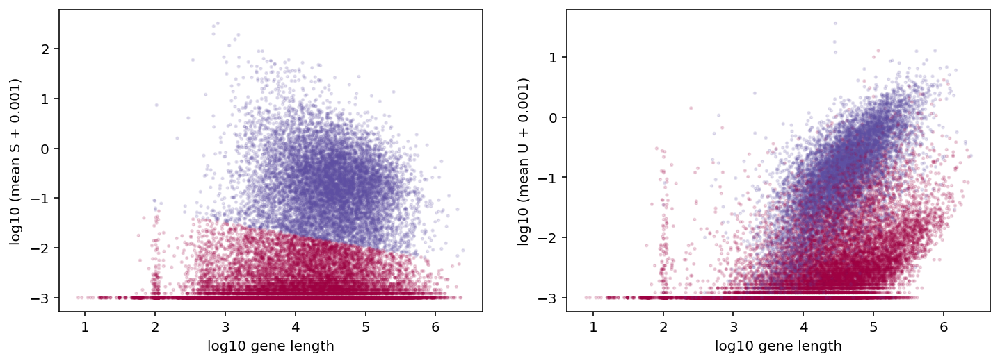

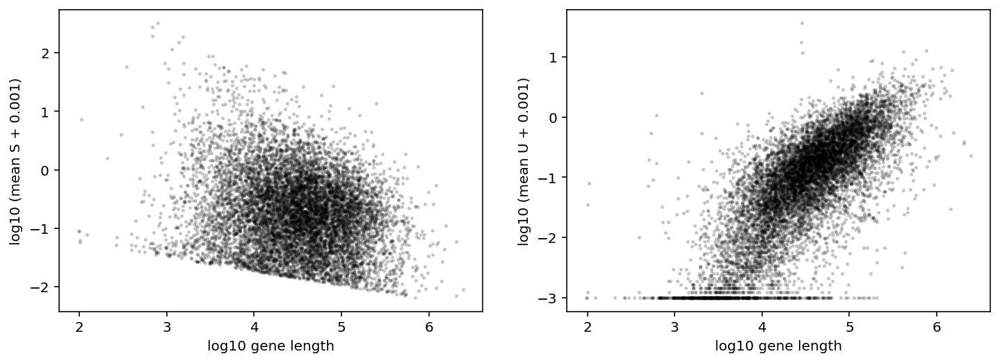

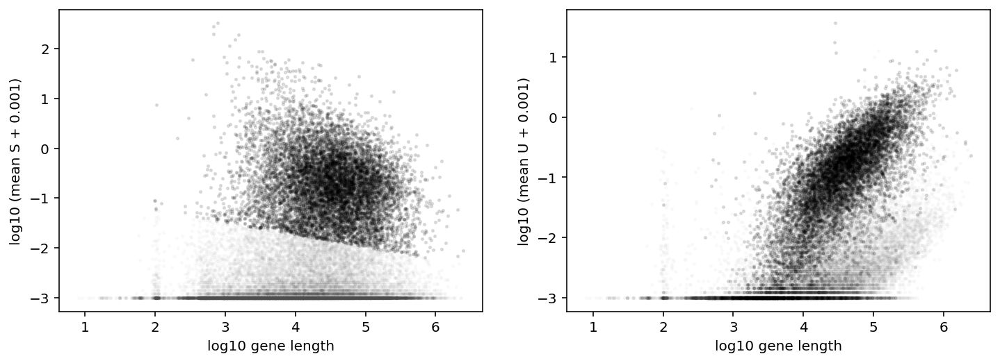

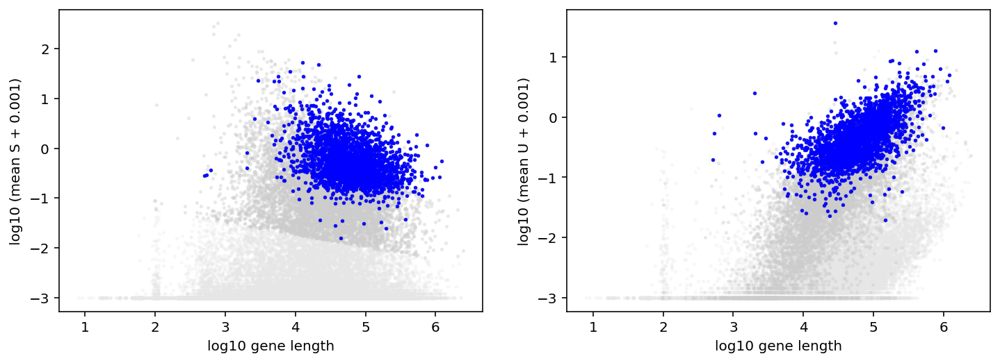

In [24]:
inference_workflow(control_combo_loom[0]+'_input.txt')
#output looks ok, clear separation between high and low count genes

### **Assess best sampling parameters with chi-squared rejection of genes**
Using a chi-squared test reject genes with poor fits and determine the best sampling and physical parameters upon removal of these genes

In [13]:
outputs = glob.glob(data_path+proj_fold+out_fold+creator+'_'+override+'_*/result.pickle')

In [27]:
out_names = [get_name(i) for i in outputs]
out_names

['crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b']

In [28]:
#Read in outputs
results = []
for i in outputs:
     results += [import_datasets([i])]

results[0].raw_S.shape

(2338, 4563)

#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


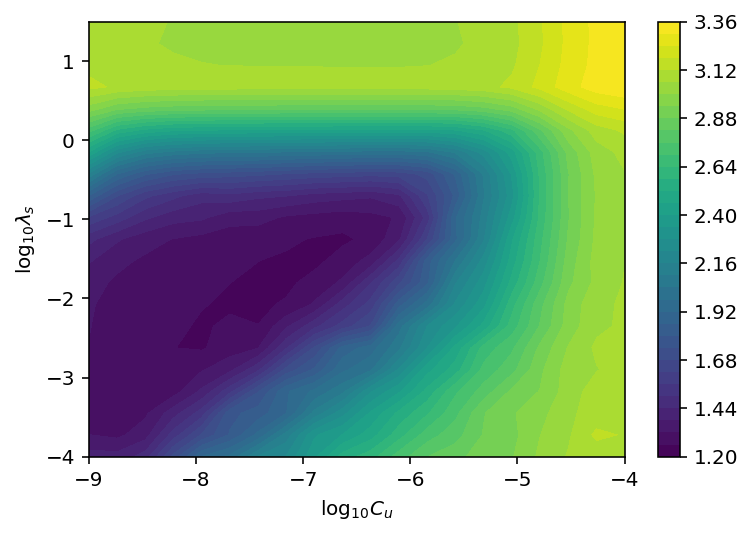

In [29]:
#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**
for i in range(0,len(results)):
    print(out_names[i])
    landscape_viz(results[i])

In [30]:
#Run chisq, set rejected genes

#Set some optimal samp params before chisq
for i in range(0,len(results)):
    results[i].find_best_params() 
    print(results[i].best_samp_params)
 

(-6.894736842105264, -1.525)


0


/home/tchari/perturbCME/notebooks/seq_cme_inference.py:382: RuntimeWarning: invalid value encountered in sqrt
  errorbars[i,:] = c*np.sqrt(np.diag(hess_inv))/np.sqrt(result_data.Ncells)


Parameter set 177 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 619 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 720 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 753 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 951 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1522 gives negative stdev; replaced with mean. (Search converged to local minimum?)


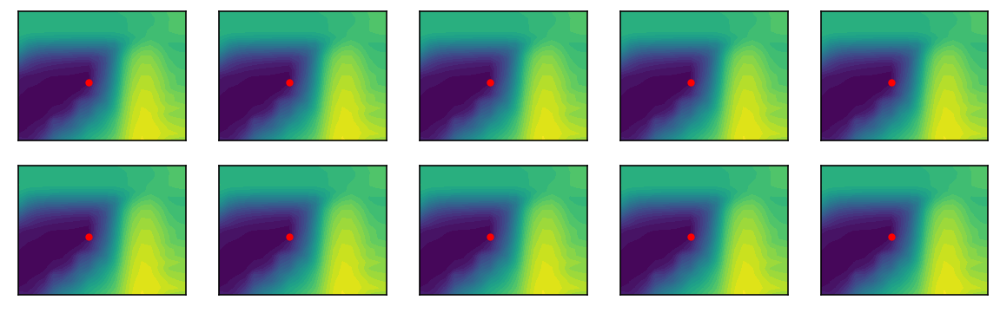

In [19]:
#Run chisq, set rejected genes
 
for i in range(0,len(results)):
    print(i)
    chisq_gen(results[i],EPS=1e-20) #1e-12 too large --> numerical discrepancies b/w obs vs expect freqs
    compute_sigma(results[i])
    chisq_best_param_correction(results[i],overwrite=True,EPS=1e-20) #Copy github and change params

In [21]:
for i in range(0,len(results)): 
    print(out_names[i] + ' New params: ', results[i].best_samp_params)
    perc = np.round(np.sum(results[i].gene_rej)/results[i].n_gen,3)*100
    print(out_names[i]+': '+str(np.sum(results[i].gene_rej))+' genes of '+str(results[i].n_gen)+' ('+ str(perc)+'%) have been rejected by chi-square.')
    print()

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b: 218 genes of 2338 (9.3%) have been rejected by chi-square.



In [33]:
for i in range(0,len(results)):
    print(out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b avg KL: 0.007532027044264655


#### **Look at parameters fits**

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


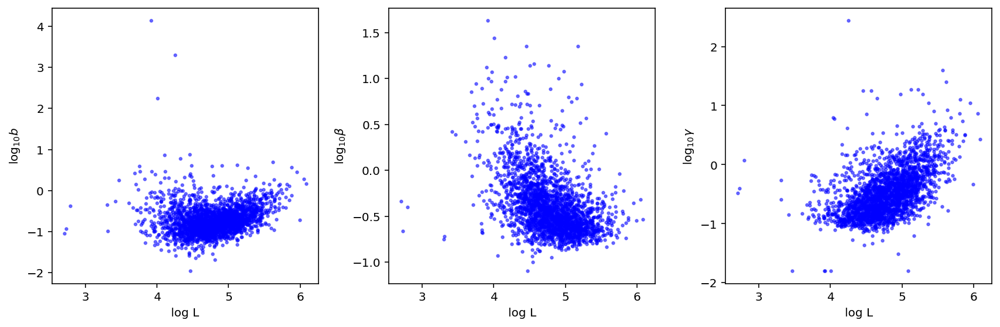

In [31]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,nosamp=True,chisq_correct=False)  #May see length dependence

crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


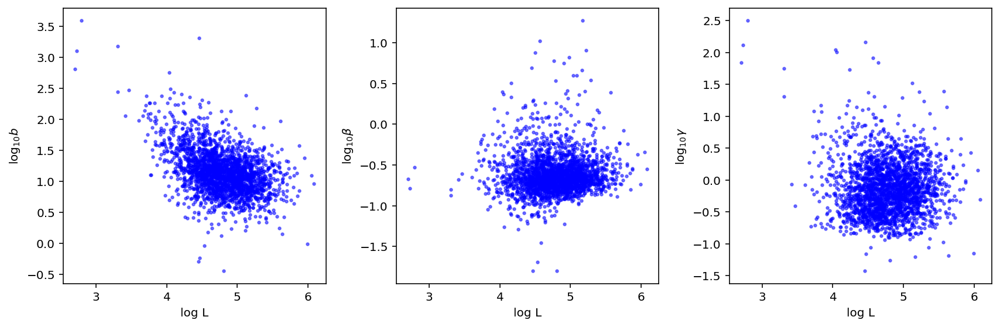

In [32]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,chisq_correct=False)  #Should not see length dep (besides burst size)

### **Repeat for each control separately**
(1) First check if best params are close to params from all controls (After chi-squared rejection)

(2) Set 1x1 grid with set sample params and find best physical params for all controls

### **Conduct gene selection and sampling parameter fitting for *each* Negative Control**
Selected negative controls with >500 cells 

In [24]:
for i in range(0,len(control_looms)):
    genRunInput(fname=control_looms[i]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
                outDir=data_path+proj_fold+out_fold,loomName = control_looms[i],
                nCu='20',nlambda='21', restart='5', niter='40', ncor='40',
                attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override) #gList= selGenes+','+filtGenes,
    

['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
1465 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220419_crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_2338gen_1 created; metadata written.
420 of 420 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 24.0 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl4a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
780 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220419_crisprsgNegCtrl4a_sgNegCtrl3b_20x21_2338gen_1 created; metadata written.
420 of 420 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 23.1 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl8a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features 

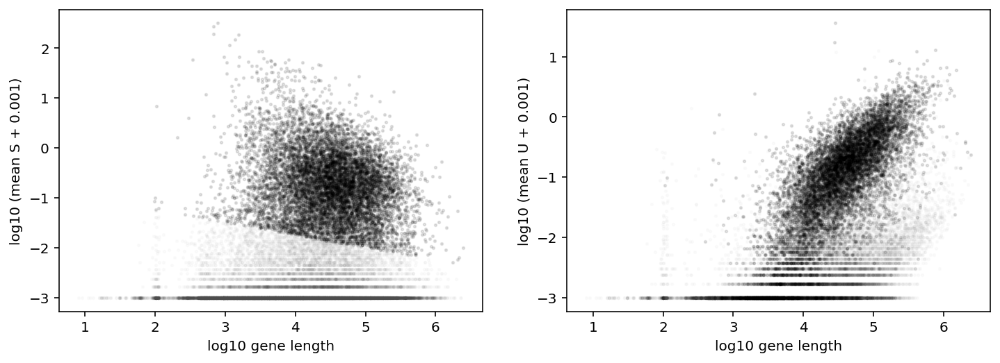

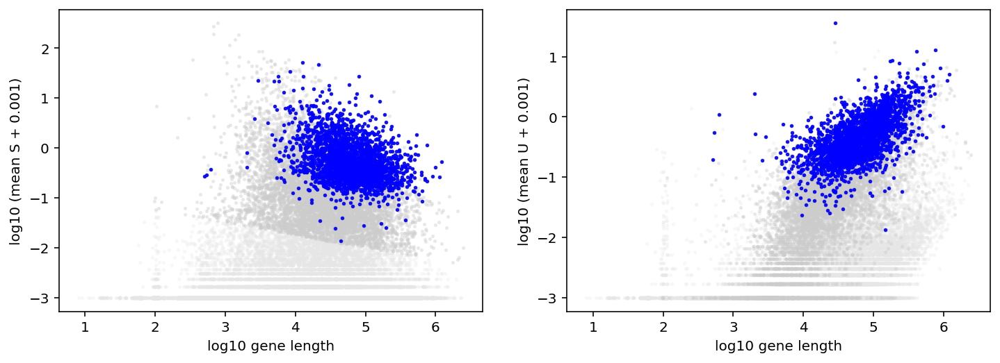

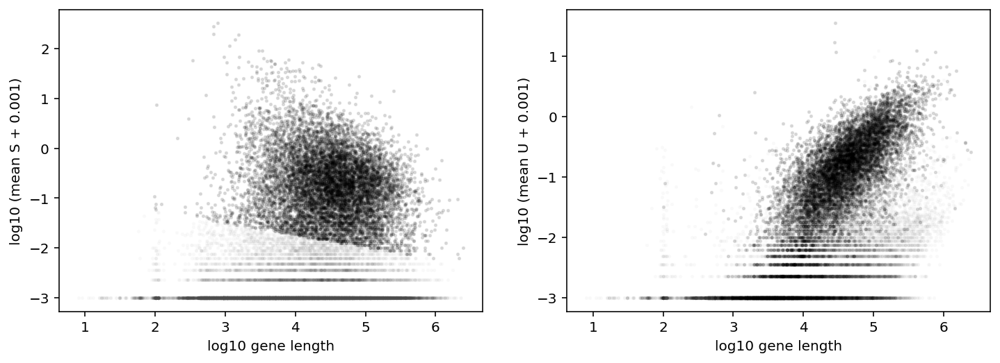

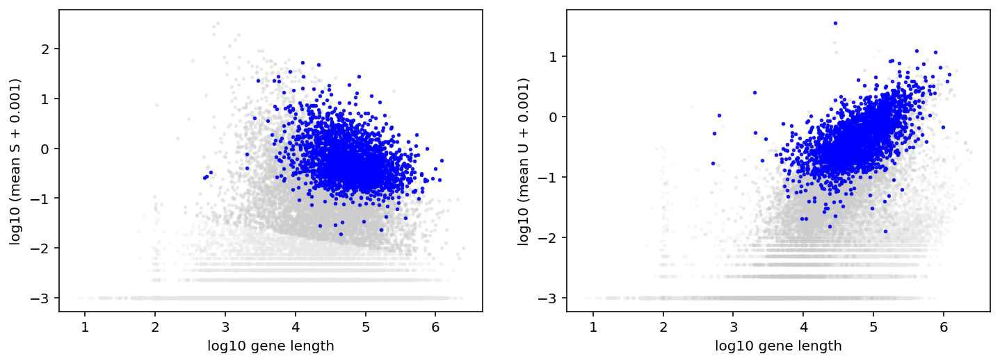

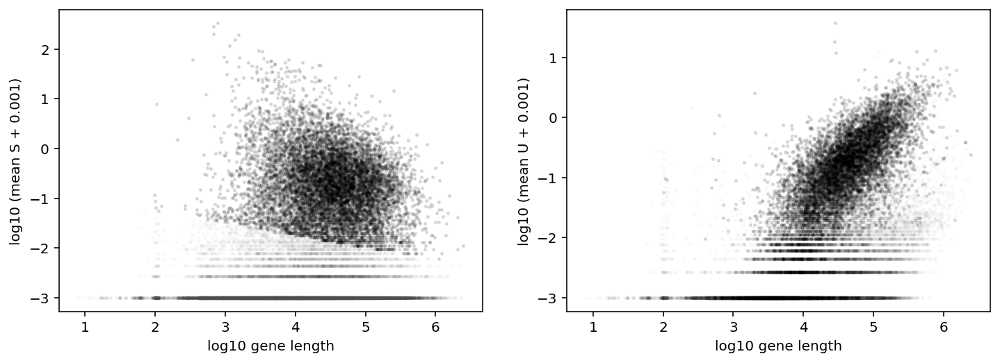

...

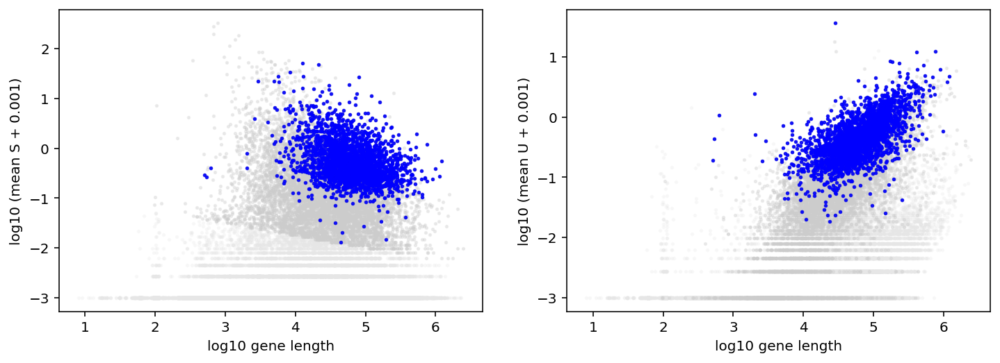

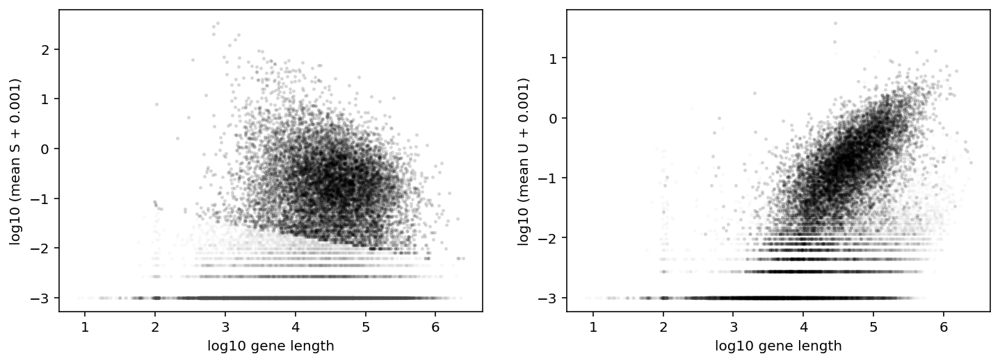

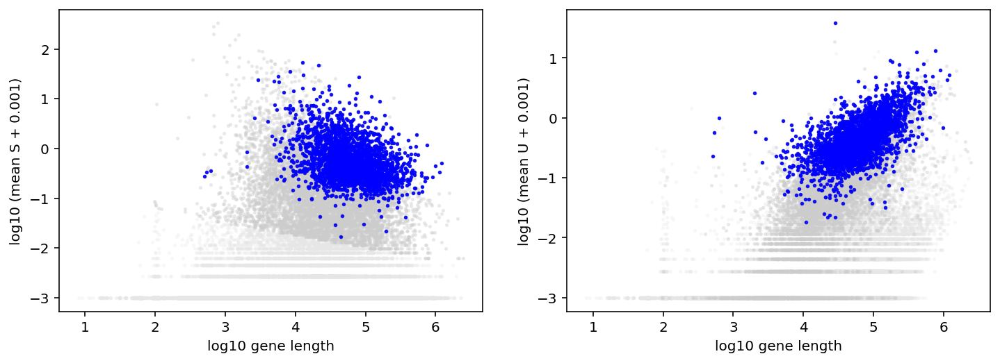

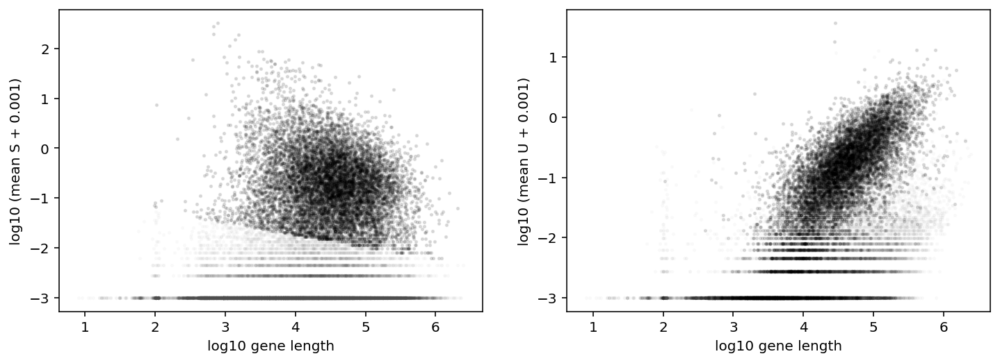

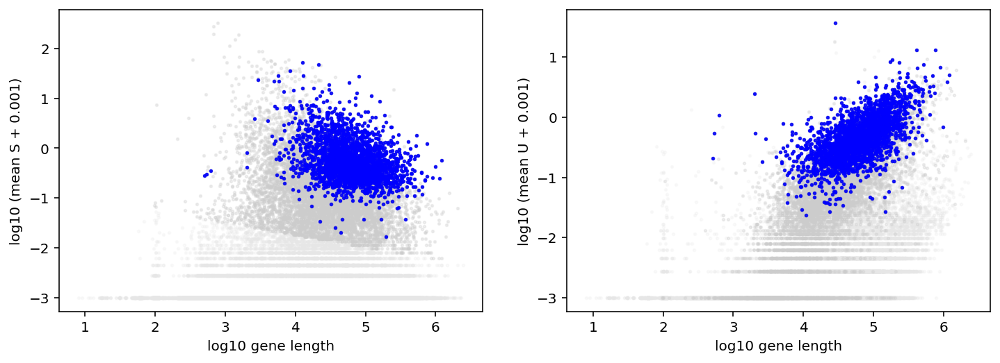

In [25]:
for i in range(0,len(control_looms)):
    inference_workflow(control_looms[i]+'_input.txt')

### **Assess best sampling parameters with chi-squared rejection of genes**
Using a chi-squared test reject genes with poor fits and determine the best sampling and physical parameters upon removal of these genes

In [24]:
outputs = glob.glob(data_path+proj_fold+out_fold+creator+'_'+override+'_*20x21*/result.pickle')

In [25]:
out_names = [get_name(i) for i in outputs]
out_names

['crisprsgNegCtrl4a_sgNegCtrl3b',
 'crisprsgNegCtrl5a_sgNegCtrl3b',
 'crisprsgNegCtrl9a_sgNegCtrl3b',
 'crisprsgNegCtrl1a_sgNegCtrl3b',
 'crisprsgNegCtrl02093a_sgNegCtrl3b',
 'crisprsgNegCtrl8a_sgNegCtrl3b',
 'crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b']

In [26]:
#Read in outputs
results = []
for i in outputs:
     results += [import_datasets([i])]

results[0].raw_S.shape

(1211, 780)

#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**

crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


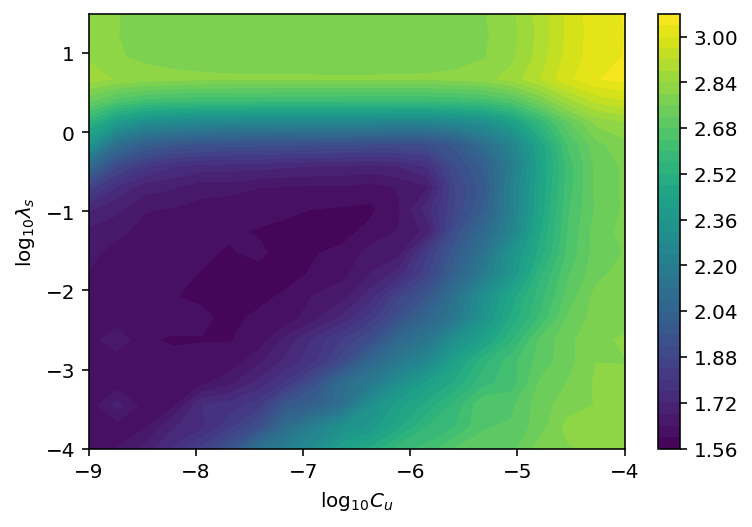

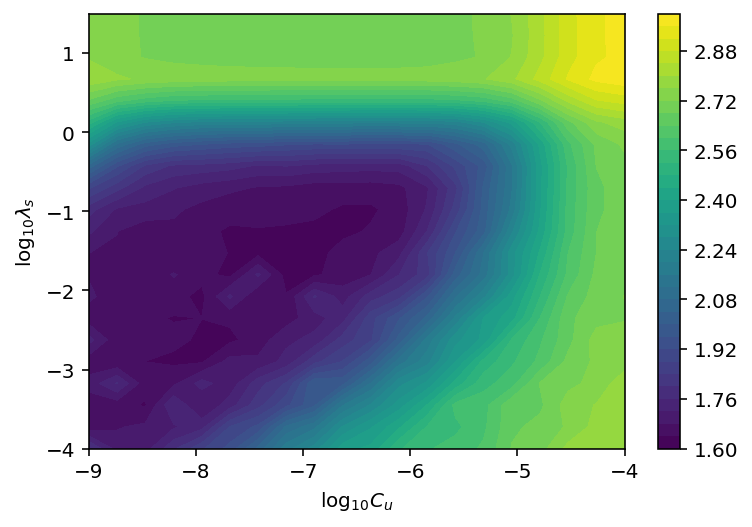

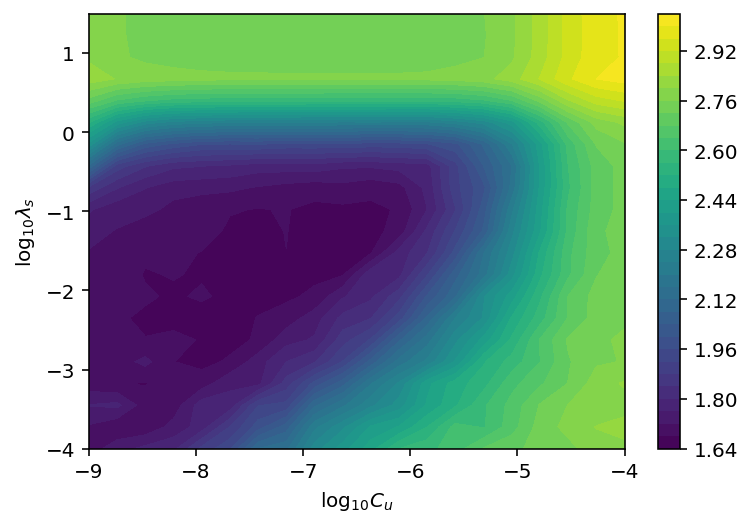

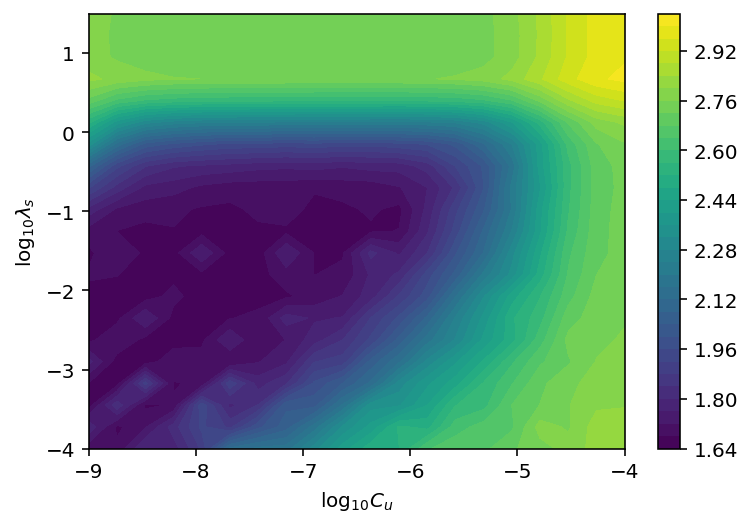

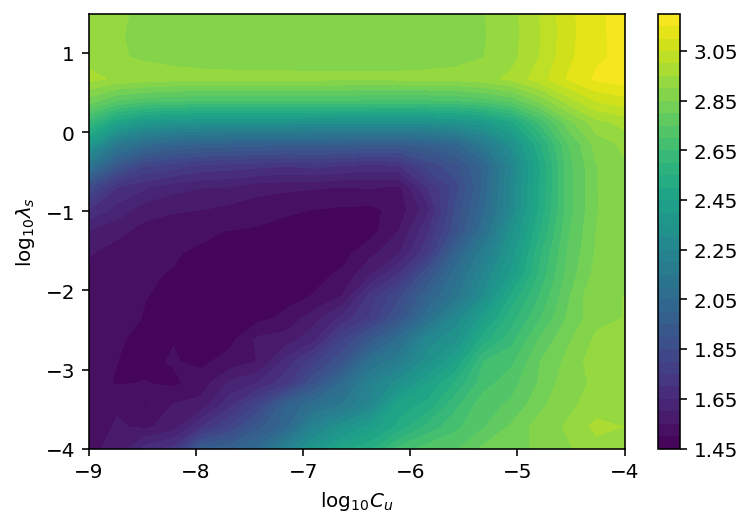

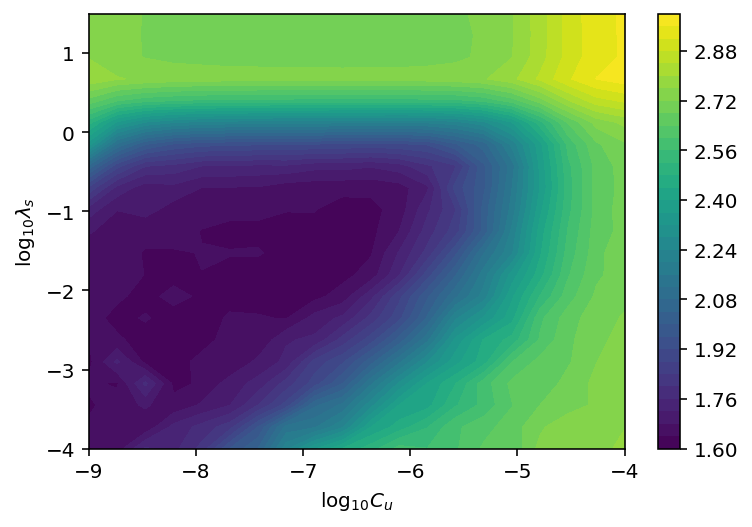

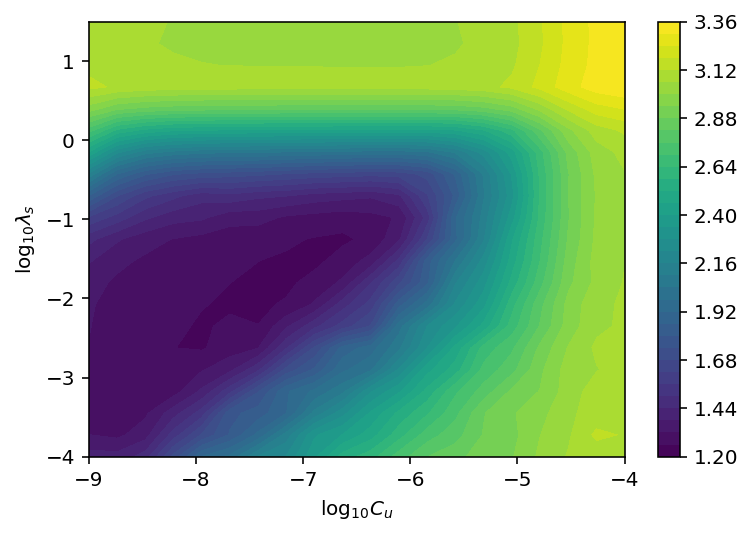

In [27]:
#### **Do chi-squared correction (reject genes with bad fits) and re-evaluate best params**
for i in range(0,len(results)):
    print(out_names[i])
    landscape_viz(results[i])

In [28]:
#Run chisq, set rejected genes

#Set some optimal samp params before chisq
for i in range(0,len(results)):
    results[i].find_best_params() 
    print(results[i].best_samp_params)
 

(-6.631578947368421, -1.25)
(-6.894736842105264, -1.525)
(-6.631578947368421, -1.25)
(-8.473684210526315, -2.9)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)


0
Parameter set 997 gives negative stdev; replaced with mean. (Search converged to local minimum?)
1
Parameter set 692 gives negative stdev; replaced with mean. (Search converged to local minimum?)
2
3
Parameter set 878 gives negative stdev; replaced with mean. (Search converged to local minimum?)
4
5
6
Parameter set 328 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 906 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 980 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1569 gives negative stdev; replaced with mean. (Search converged to local minimum?)


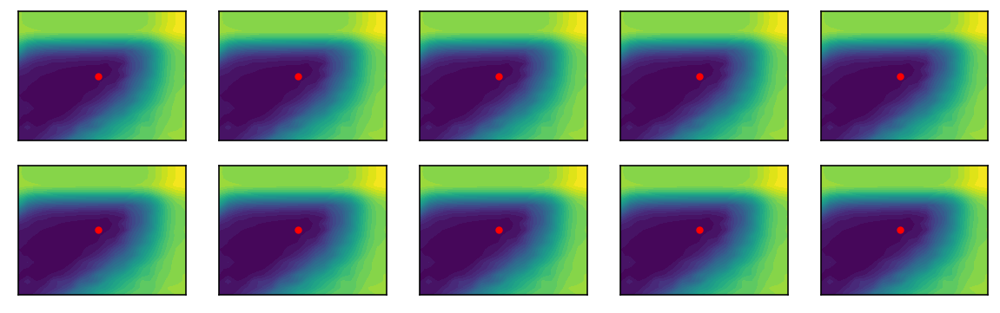

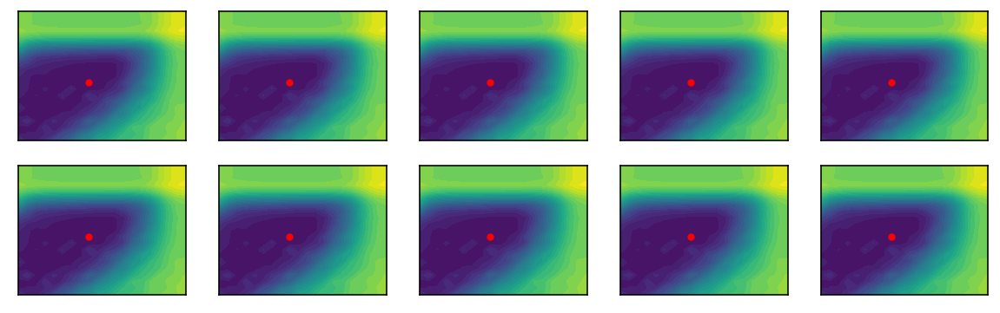

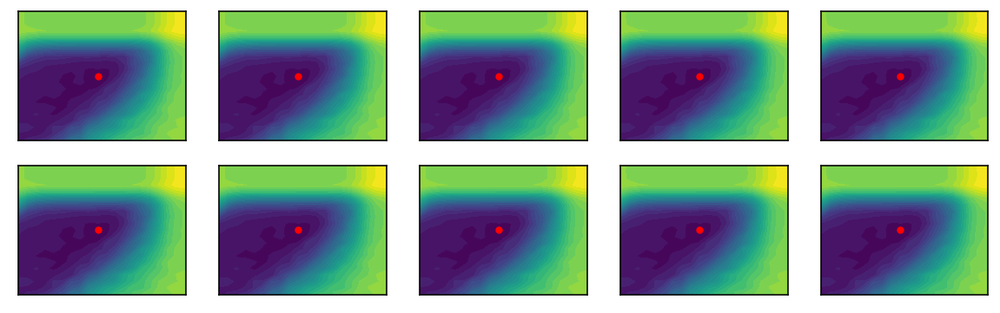

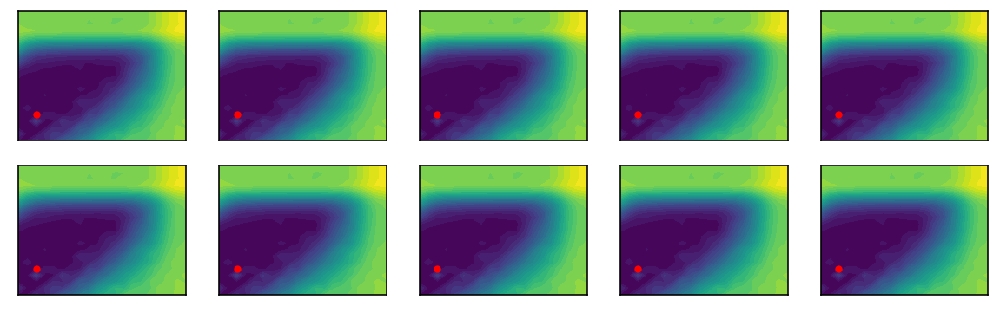

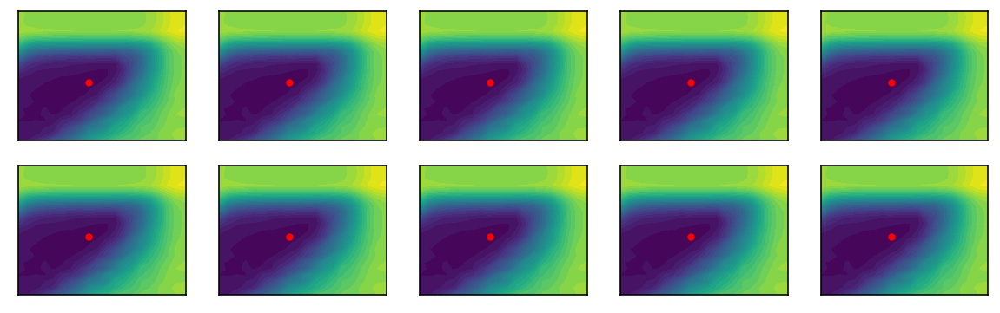

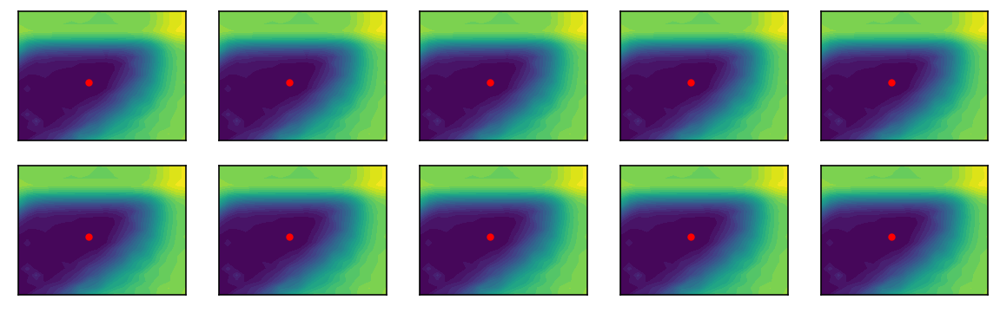

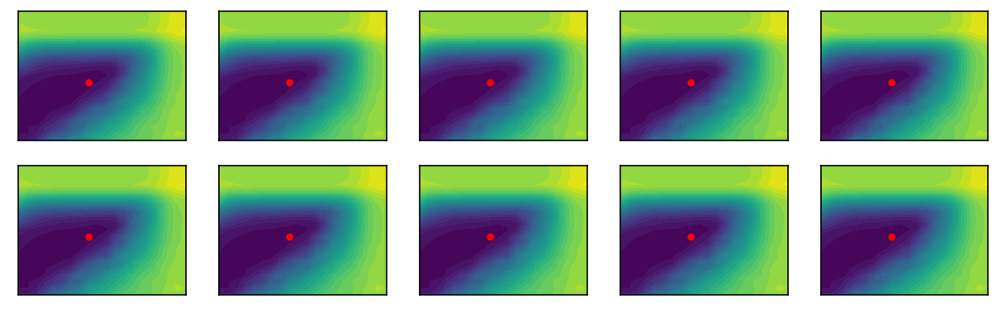

In [29]:
#Run chisq, set rejected genes
 
for i in range(0,len(results)):
    print(i)
    chisq_gen(results[i],EPS=1e-20) #1e-12 too large --> numerical discrepancies b/w obs vs expect freqs
    compute_sigma(results[i])
    chisq_best_param_correction(results[i],overwrite=True,EPS=1e-20) #Copy github and change params

In [31]:
for i in range(0,len(results)): 
    print(out_names[i] + ' New params: ', results[i].best_samp_params)
    perc = np.round(np.sum(results[i].gene_rej)/results[i].n_gen,3)*100
    print(out_names[i]+': '+str(np.sum(results[i].gene_rej))+' genes of '+str(results[i].n_gen)+' ('+ str(perc)+'%) have been rejected by chi-square.')
    print()

crisprsgNegCtrl4a_sgNegCtrl3b New params:  (-6.631578947368421, -1.25)
crisprsgNegCtrl4a_sgNegCtrl3b: 31 genes of 1211 (2.6%) have been rejected by chi-square.

crisprsgNegCtrl5a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl5a_sgNegCtrl3b: 38 genes of 1045 (3.5999999999999996%) have been rejected by chi-square.

crisprsgNegCtrl9a_sgNegCtrl3b New params:  (-6.631578947368421, -1.25)
crisprsgNegCtrl9a_sgNegCtrl3b: 43 genes of 1112 (3.9%) have been rejected by chi-square.

crisprsgNegCtrl1a_sgNegCtrl3b New params:  (-8.473684210526315, -2.9)
crisprsgNegCtrl1a_sgNegCtrl3b: 49 genes of 1087 (4.5%) have been rejected by chi-square.

crisprsgNegCtrl02093a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl02093a_sgNegCtrl3b: 101 genes of 1595 (6.3%) have been rejected by chi-square.

crisprsgNegCtrl8a_sgNegCtrl3b New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl8a_sgNegCtrl3b: 13 genes of 1027 (1.3%) have been rejected by chi-square.

crisprsg

#### **Look at parameters fits**

crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


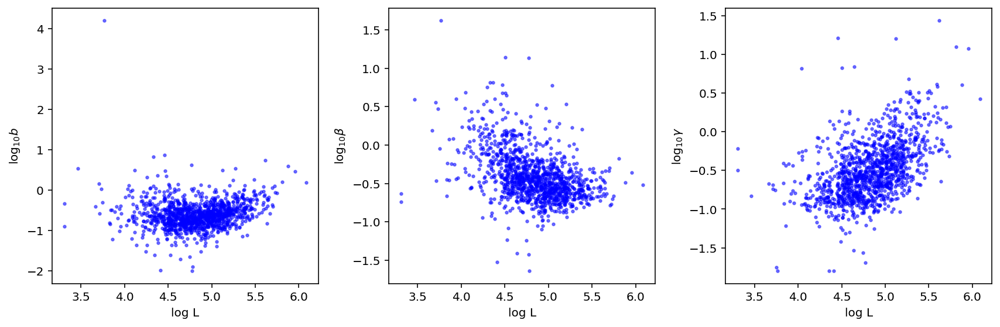

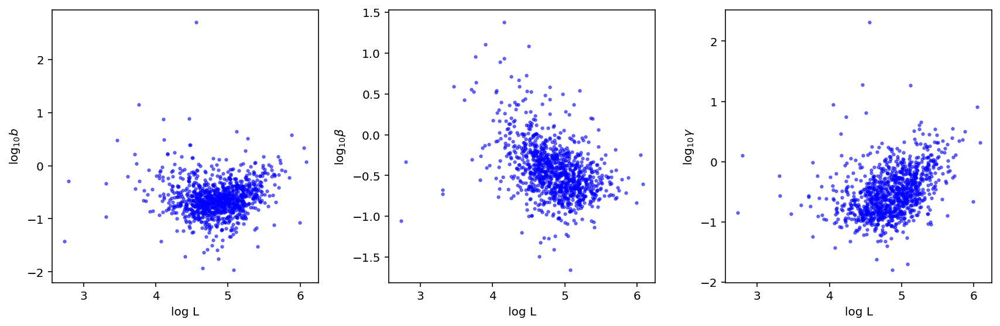

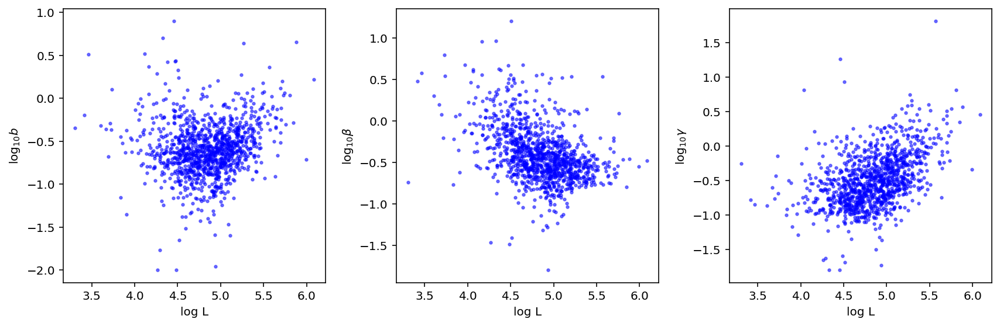

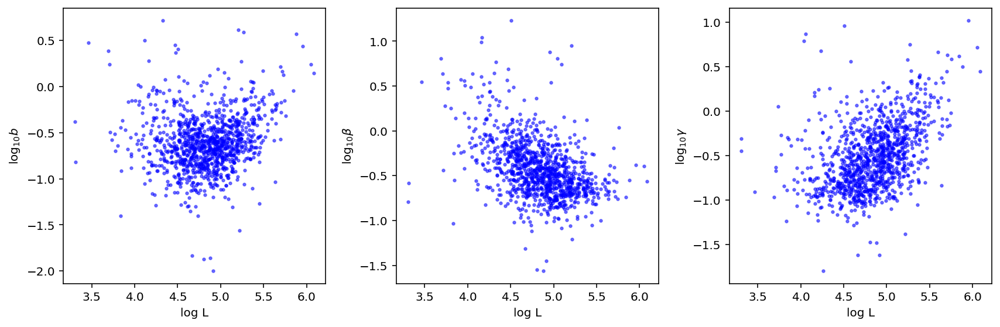

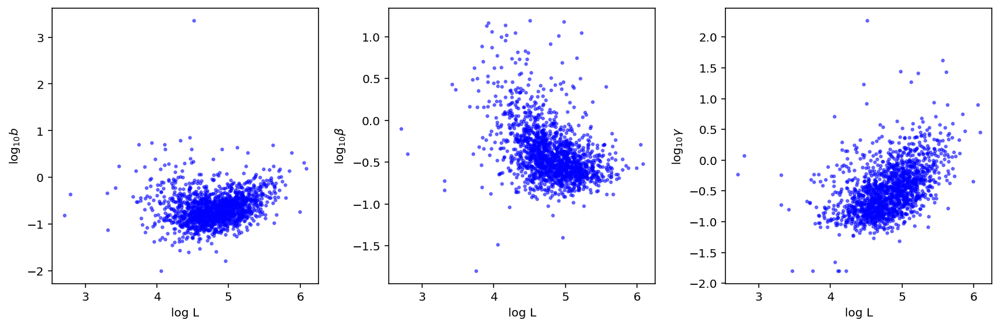

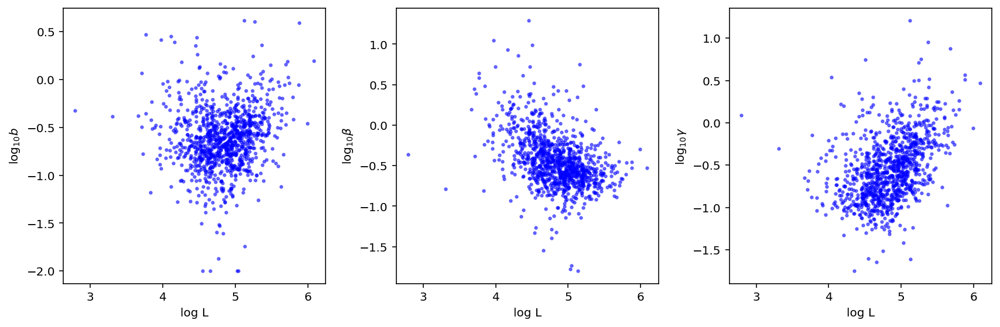

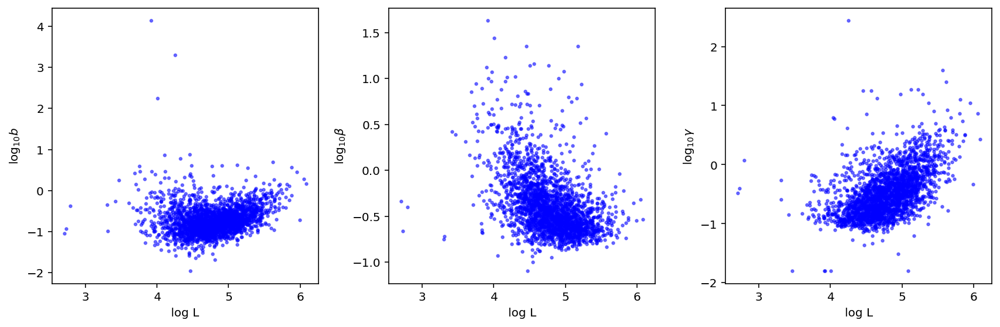

In [32]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,nosamp=True,chisq_correct=False)  #May see length dependence

crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


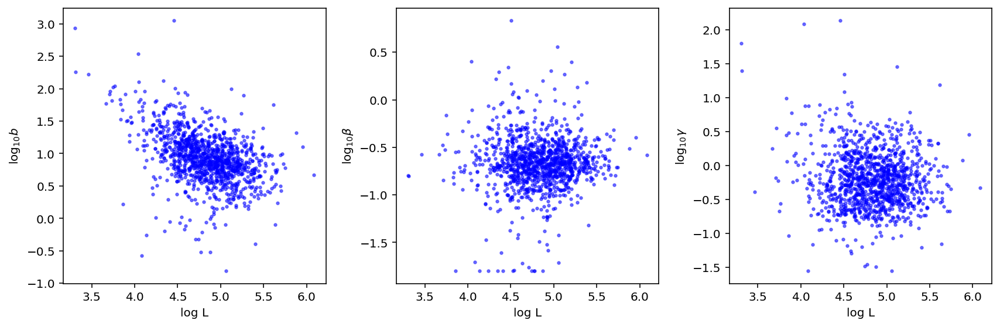

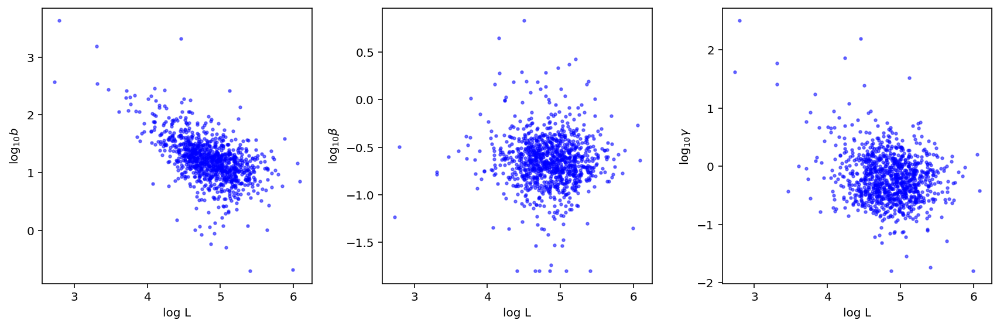

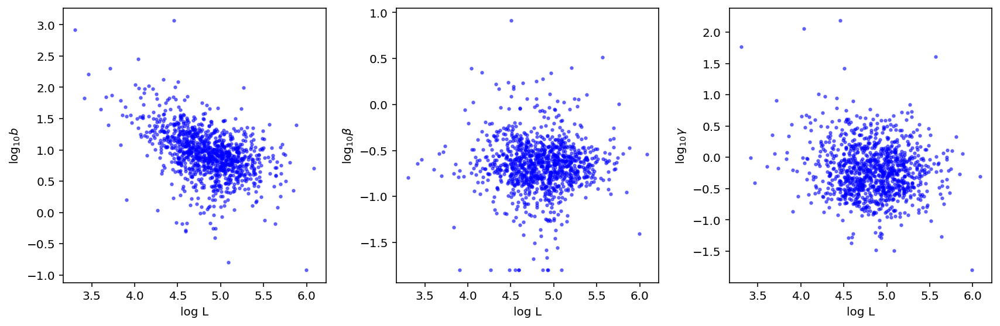

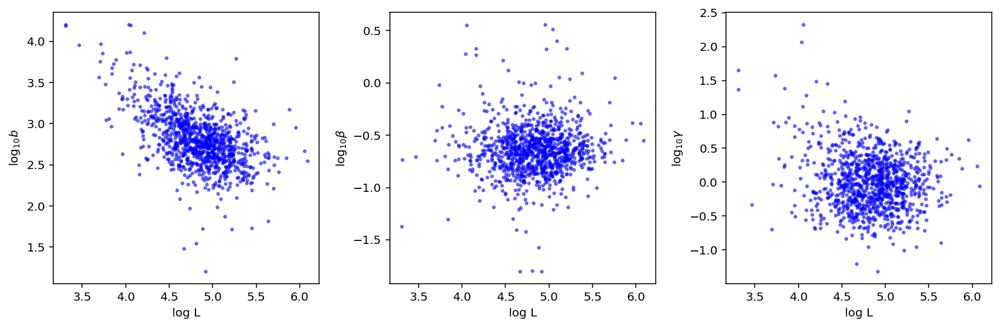

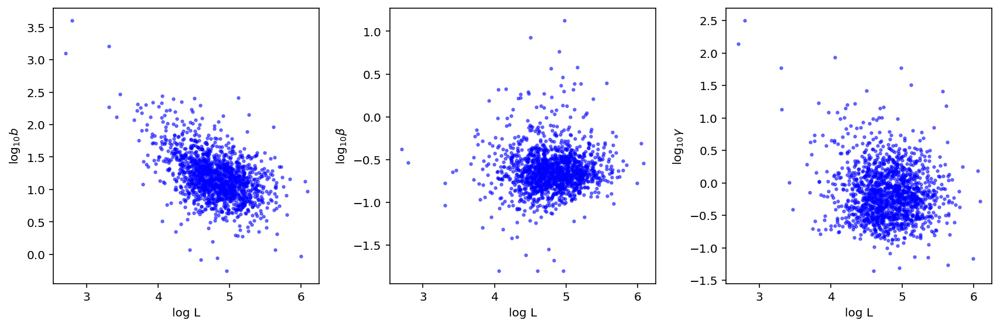

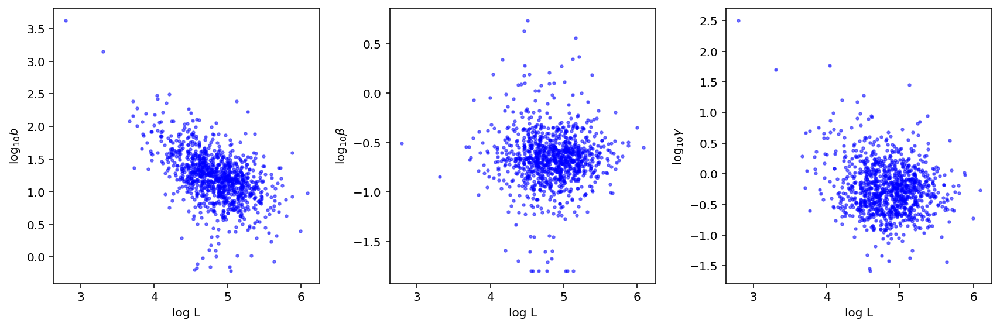

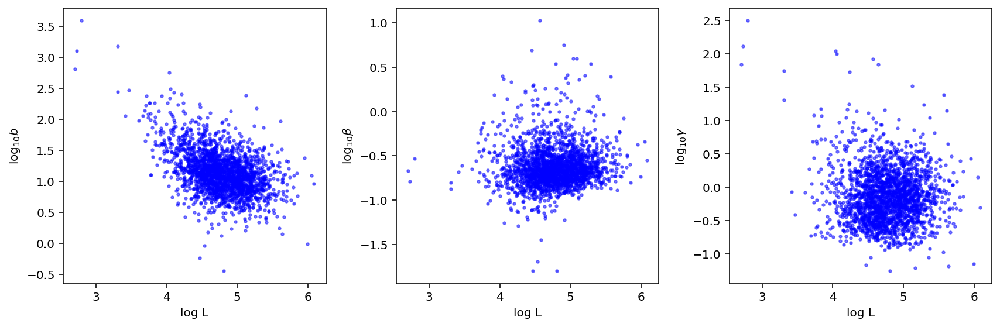

In [33]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False)  #chisq_correct=False
    #Should not see length dep (besides burst size)

In [21]:
#--------------- Test if MoM parameter values remove clusters --------------- 
for r in range(len(results)):
    
    bestParams = np.zeros((results[r].moment_data.shape[0],results[r].moment_data.shape[1]))

    for i in range(results[r].moment_data.shape[0]):
        sampParams = np.array(results[r].best_samp_params)
        sampParams[0] = sampParams[0]+results[r].gene_log_lengths[i]
        bestParams[i,:] = MoM_initialization(results[r].moment_data[i,:],results[r].search_params.lb_log,
                                    results[r].search_params.ub_log,samp=sampParams)
        
    results[r].best_phys_params = bestParams

crisprsgNegCtrl4a_sgNegCtrl3b
crisprsgNegCtrl5a_sgNegCtrl3b
crisprsgNegCtrl9a_sgNegCtrl3b
crisprsgNegCtrl1a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b
crisprsgNegCtrl8a_sgNegCtrl3b
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


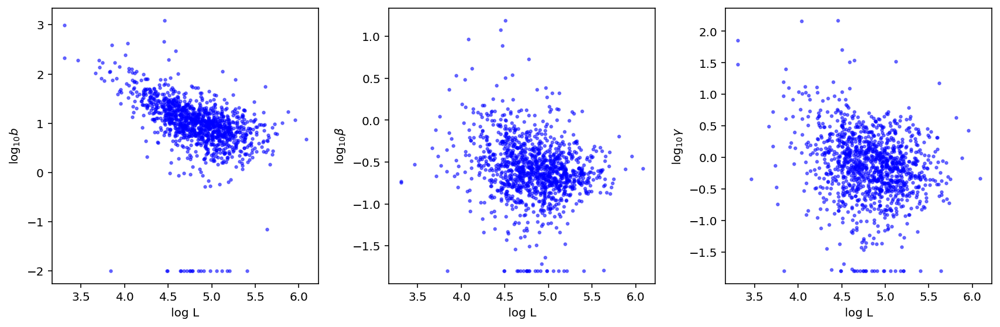

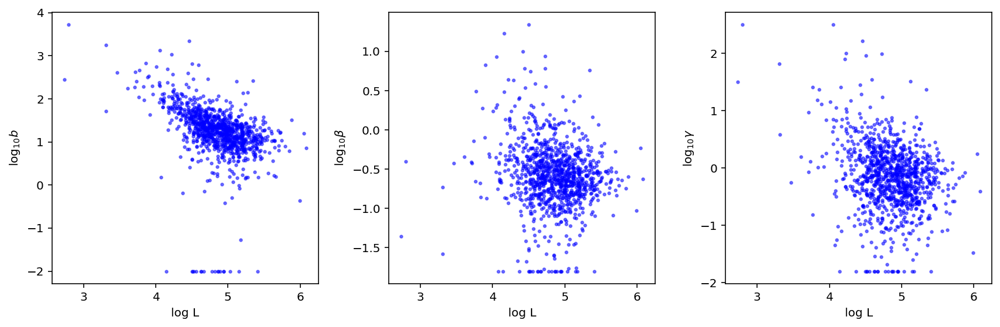

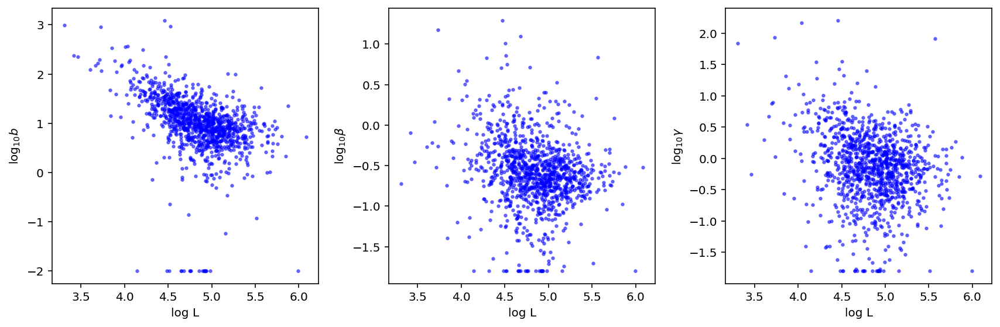

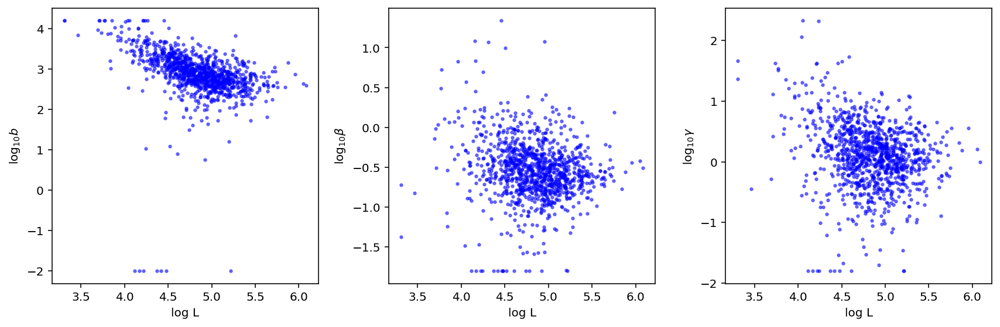

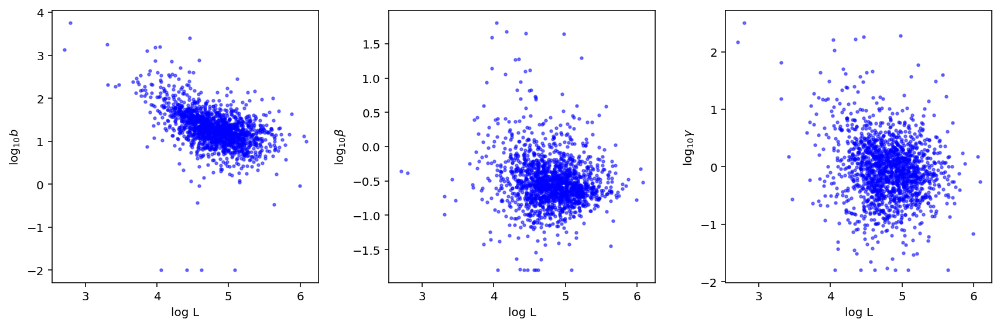

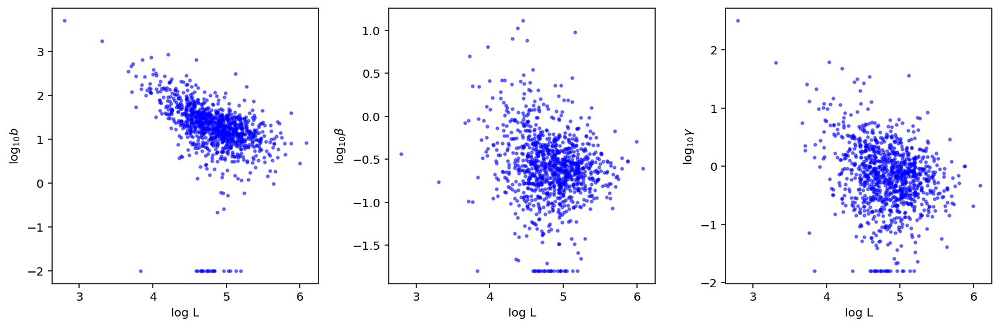

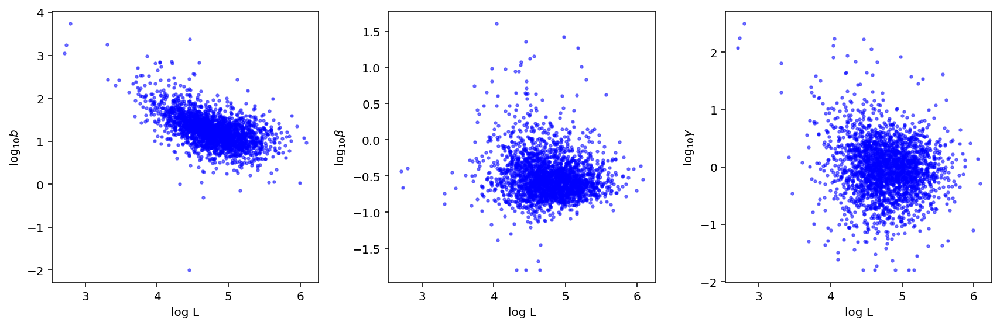

In [22]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,chisq_correct=False)  #Should not see length dep (besides burst size)

In [34]:
#Get errors at end of optimization routine

for i in range(0,len(results)):
    print(out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))


crisprsgNegCtrl4a_sgNegCtrl3b avg KL: 0.03199650051363708
crisprsgNegCtrl5a_sgNegCtrl3b avg KL: 0.04013126370530858
crisprsgNegCtrl9a_sgNegCtrl3b avg KL: 0.04121050835968451
crisprsgNegCtrl1a_sgNegCtrl3b avg KL: 0.041772361930328364
crisprsgNegCtrl02093a_sgNegCtrl3b avg KL: 0.018804059056105084
crisprsgNegCtrl8a_sgNegCtrl3b avg KL: 0.04017293774037943
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b avg KL: 0.007532027044264655


### **Set params for controls**

In [44]:
#For each control set best params to those at all-control samp params

#-7.333333333333333, -0.14999999999999947
#-7.333333333333333, -1.7999999999999998
#-7.888888888888889, -1.7999999999999998
s = np.sum(np.array(results[5].sampl_vals) == [-6.894736842105264, -1.525],axis=1)
best_ind = np.where(s == 2)[0][0]

for i in range(0,len(results)):
    results[i].best_samp_params = results[i].sampl_vals[best_ind]
    results[i].best_phys_params = results[i].gene_params[best_ind]
    results[i].best_ind = best_ind
        

## **Assess correlation of Control Fits**

In [10]:
c_highlight = col_red
c1 = [173/255,214/255,200/255]
c2 = [59/255,131/255,130/255]
ncol=20
cmap = ListedColormap(np.array([np.linspace(c2[j],c1[j],ncol) for j in range(3)]).T)

In [ ]:
combinations_object = combinations(range(0,len(results)), 2)
rep_pairs = list(combinations_object)

In [44]:
list(set([1,2,3]).intersection([2,3]))

[2, 3]

In [41]:
results[0].gene_names.index('VMP1')

0

array([False, False, False, ..., False, False, False])

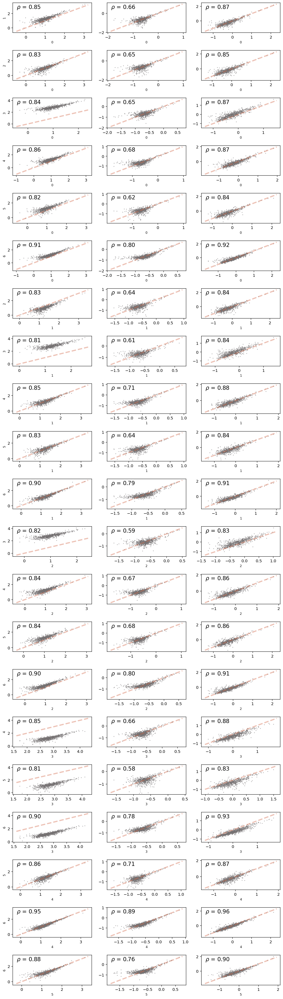

In [46]:
ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=len(rep_pairs),ncols=3,figsize=(10,35))
nbin=30
for i in range(len(rep_pairs)):
    K = rep_pairs[i]
    #print(looms[K[0]])
    res1 = results[K[0]]#import_precomputed_(results[K[0]])


    #print(looms[K[1]])
    res2 = results[K[1]]#import_precomputed_(results[K[1]])
    #chisq_gen(res2)

    err1 = res1.sigma*2.576
    err2 = res2.sigma*2.576


    for j in range(3):

#         filt = ~res1.gene_rej & ~res2.gene_rej \
#             & ~check_at_bounds(res1,res1.best_phys_params)\
#             & ~check_at_bounds(res2,res2.best_phys_params)
        
#         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#             res2.best_phys_params[filt,j],
#             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)

        remain1 = np.array(res1.gene_names)[~res1.gene_rej & ~check_at_bounds(res1,res1.best_phys_params)]

        remain2 = np.array(res2.gene_names)[~res2.gene_rej & ~check_at_bounds(res2,res2.best_phys_params)]

        remain = list(set(remain1).intersection(remain2))

        filt1 = [res1.gene_names.index(i) for i in remain]
        filt2 = [res2.gene_names.index(i) for i in remain]
    
    
        ax1[i,j].scatter(res1.best_phys_params[filt1,j],
                   res2.best_phys_params[filt2,j],color=col_gray,alpha=alf_fail,s=ms_fail)
    
        #print(res1.best_phys_params[filt,j].shape)


        fs=14
        sml=8
        rho=np.corrcoef(res1.best_phys_params[filt1,j],res2.best_phys_params[filt2,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(str(K[0]),fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel(str(K[1]),fontsize=sml)
        ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()

In [47]:
for i in range(len(results)):
    print(str(i),': ',out_names[i])

0 :  crisprsgNegCtrl4a_sgNegCtrl3b
1 :  crisprsgNegCtrl5a_sgNegCtrl3b
2 :  crisprsgNegCtrl9a_sgNegCtrl3b
3 :  crisprsgNegCtrl1a_sgNegCtrl3b
4 :  crisprsgNegCtrl02093a_sgNegCtrl3b
5 :  crisprsgNegCtrl8a_sgNegCtrl3b
6 :  crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b


## **Inference for Perturbed Samples**
Set a 1x1 'grid' with sampling parameters chosen for all controls and fit physical parameters

### **Conduct gene selection and sampling parameter fitting for each Perturbed condition**
Looking at HUS1a and sgFDPSb gRNA cells

In [ ]:
#nCu='10',nlambda='11', lbSamp='-9, -4',ubSamp='-4, 1.5'
#perturb_looms

In [49]:
#nCu='1',nlambda='1',
#lbSamp='-7.333333333333333, -1.7999999999999998',ubSamp='-7.333333333333333, -1.7999999999999998',
for i in range(0,len(perturb_looms)):
    genRunInput(fname=perturb_looms[i]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
                outDir=data_path+proj_fold+out_fold,loomName = perturb_looms[i], 
                nCu='20',nlambda='21', restart='5', niter='40', ncor='40',
                attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=override) #gList= selGenes+','+filtGenes,

['/home/tchari/counts/replogle_crispr/loom/crisprsgHUS1_2a_sgFDPS_2b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
831 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220324_crisprsgHUS1_2a_sgFDPS_2b_10x11_2338gen_1 exists.
98 of 110 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 6.8 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgHUS1_2a_sgNegCtrl3b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations. 35727 are unique. 
905 cells detected.
Directory /home/tchari/counts/replogle_crispr/loom_res/tc_220324_crisprsgHUS1_2a_sgNegCtrl3b_10x11_2338gen_1 created; metadata written.
110 of 110 points to be evaluated.
Starting search...
Parallelization done!
Runtime: 7.3 min.
['/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgFDPS_2b.loom']
Beginning search routine.
36601 features observed, 36169 match genome annotations.

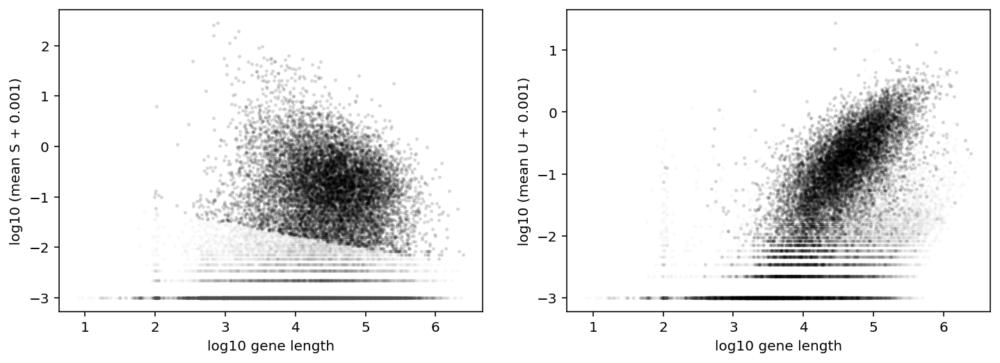

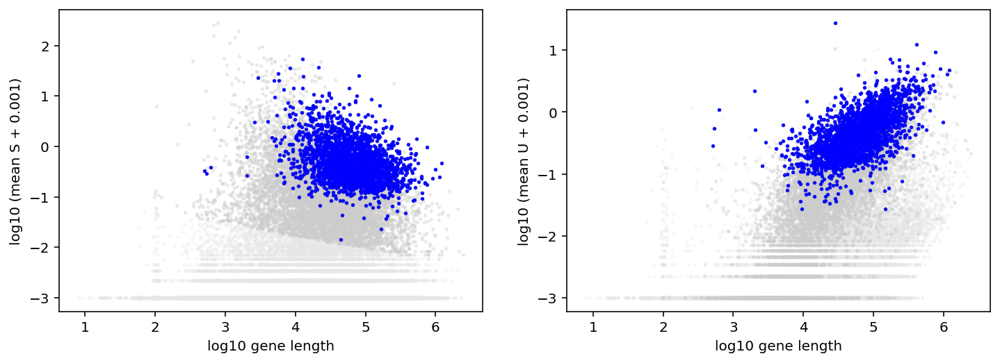

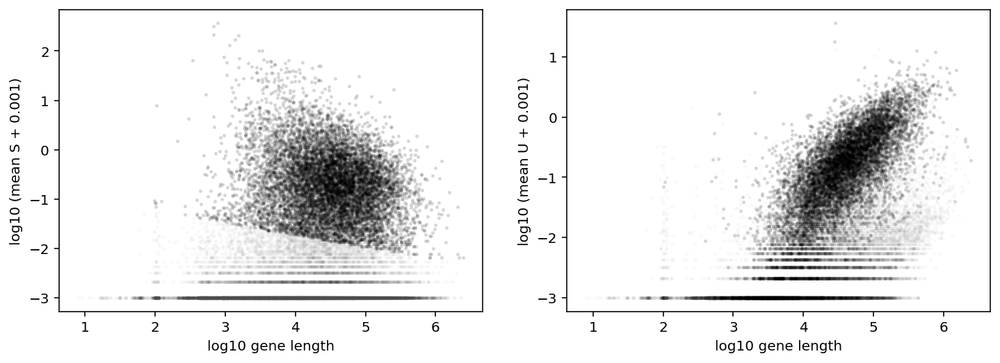

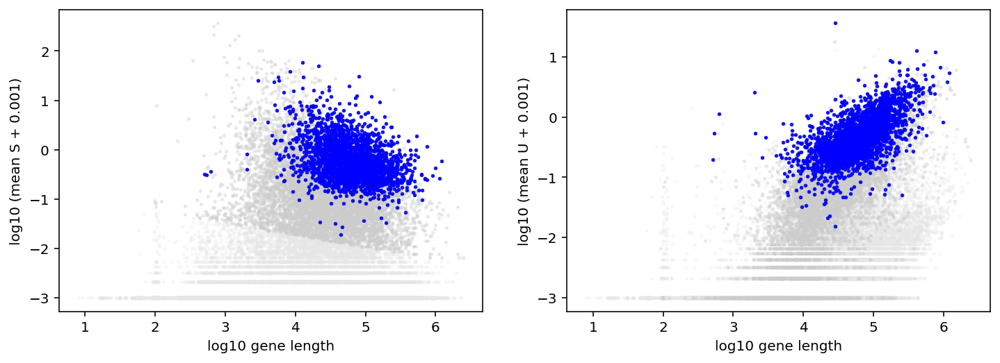

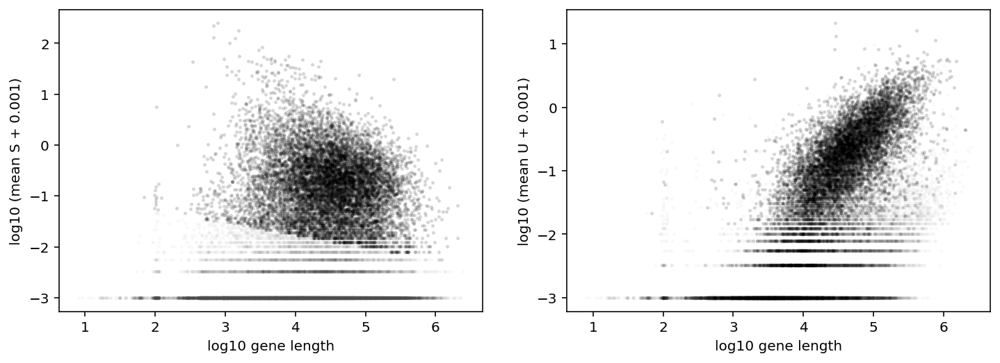

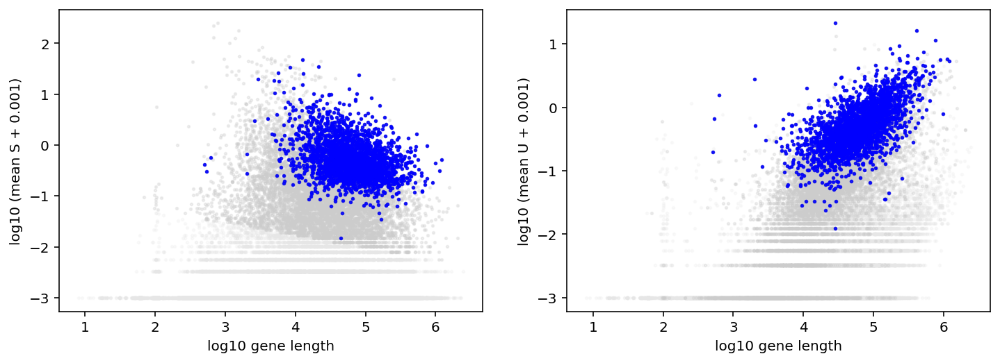

In [51]:
for i in range(0,len(perturb_looms)):
    inference_workflow(perturb_looms[i]+'_input.txt')

In [ ]:
# fname='example_input.txt',dataDir = './',outDir='./',loomName = '',tranName = '',polyaA='15',tInd='0',
#                 filt='0.01, 0.01, 350, 350, 3, 3',exclude='',attList="[['spliced','unspliced','Gene','Barcode']]",
#                 seed='42', nGenes='5000', ind='0', gList='', lb='-2, -1.8, -1.8', ub='4.2, 2.5, 2.5',
#                 restart='1',init='moments',length='True',niter='20',nCu='10',nlambda='11',
#                 lbSamp='-9, -4',ubSamp='-4, 1.5',suffix='1',creator='tc',ncor='20',override=''

In [94]:
# #Run control 4a with all same genes as control 5a - to get error bars between controls

# genRunInput(fname=control_looms[3]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
#             outDir=data_path+proj_fold+out_fold,loomName = control_looms[3],
#             attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=overrideErr) #gList= selGenes+','+filtGenes,




# genRunInput(fname=control_looms[1]+'_input.txt',dataDir =data_path+proj_fold+in_fold,
#             outDir=data_path+proj_fold+out_fold,loomName = control_looms[1], 
#             nCu='1',nlambda='1', restart='5', niter='40', ncor='40',gList= selGenesErr+','+filtGenesErr,
#             lbSamp='-6.894736842105264, -1.525',
#             ubSamp='-6.894736842105264, -1.525',
#             attList= "[['spliced','unspliced','Gene','Barcode']]", tranName = transcriptome,override=overrideErr) #gList= selGenes+','+filtGenes,

In [ ]:
# inference_workflow(control_looms[3]+'_input.txt')
# inference_workflow(control_looms[1]+'_input.txt')




### **Assess physical parameter fits for Perturbed samples**

In [36]:
outputs = glob.glob(data_path+proj_fold+out_fold+creator+'_'+override+'_*/result.pickle')

In [37]:
def checkName(name):
    if '1x1' in name:
        return get_name(name,'_1x1')
    else:
        return get_name(name,'_10x11')

out_names = [checkName(i) for i in outputs]
out_names

['crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl',
 'crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl',
 'crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl',
 'crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl',
 'crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl',
 'crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl',
 'crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl',
 'crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl',
 'crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl',
 'crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl']

In [38]:
#Read in outputs
results = []
for i in outputs:
     results += [import_datasets([i])]

results[0].raw_S.shape

(1211, 780)

#### **Do chi-squared correction (reject genes with bad fits)**

In [39]:
#Set some optimal samp params before chisq
for i in range(0,len(results)):
    results[i].find_best_params() 
    print(results[i].best_samp_params)

(-6.631578947368421, -1.25)
(-6.631578947368421, -1.25)
(-6.631578947368421, -1.25)
(-6.894736842105264, -1.525)
(-6.631578947368421, -1.25)
(-8.473684210526315, -2.9)
(-6.894736842105264, -1.525)
(-6.894736842105264, -1.525)
(-6.631578947368421, -1.25)
(-6.894736842105264, -1.525)


0
Parameter set 997 gives negative stdev; replaced with mean. (Search converged to local minimum?)
1
2
3
Parameter set 692 gives negative stdev; replaced with mean. (Search converged to local minimum?)
4
5
Parameter set 878 gives negative stdev; replaced with mean. (Search converged to local minimum?)
6
7
8
9
Parameter set 328 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 906 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 980 gives negative stdev; replaced with mean. (Search converged to local minimum?)
Parameter set 1569 gives negative stdev; replaced with mean. (Search converged to local minimum?)


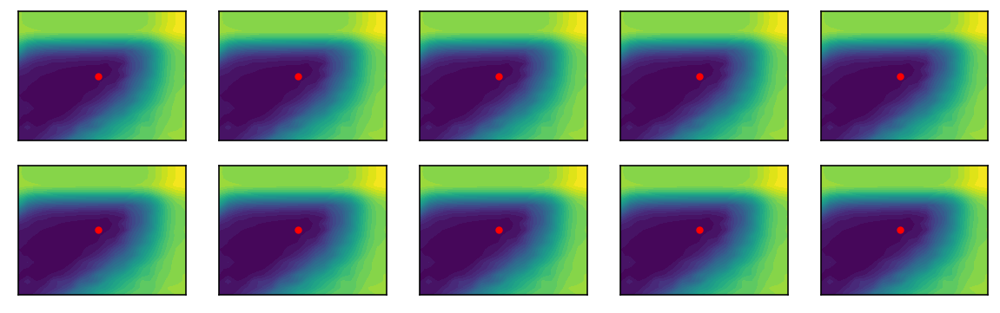

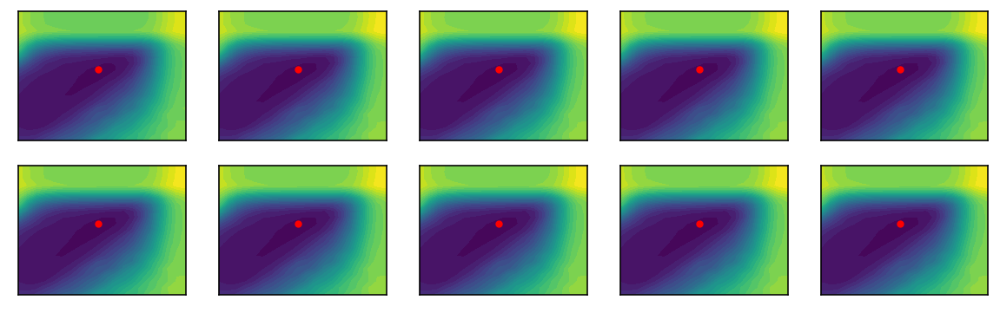

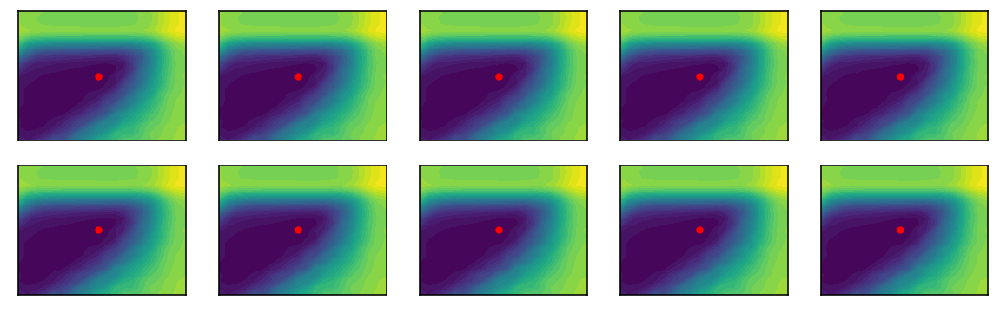

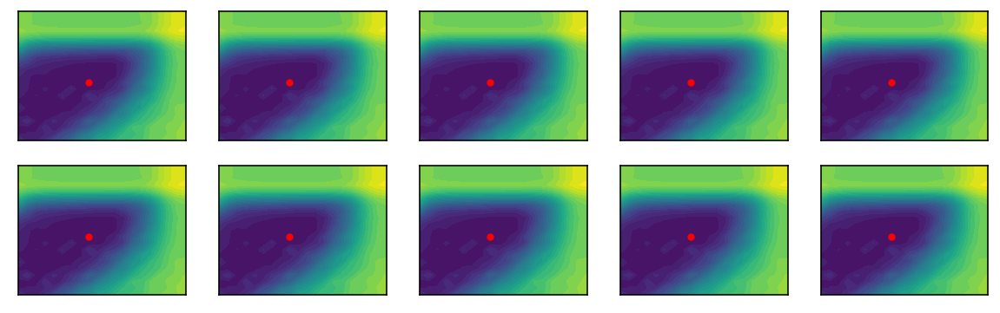

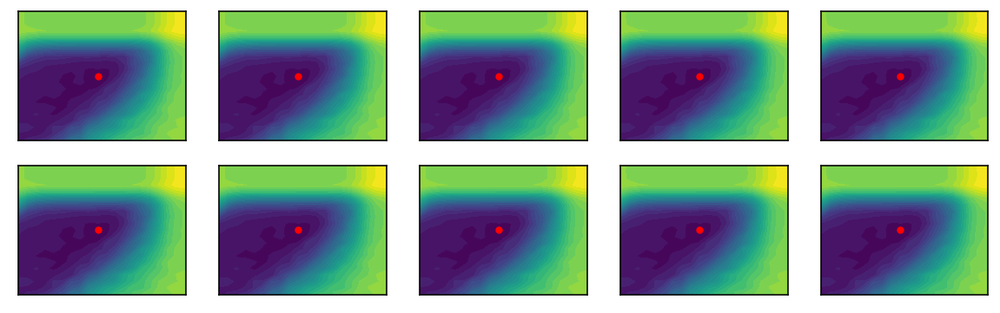

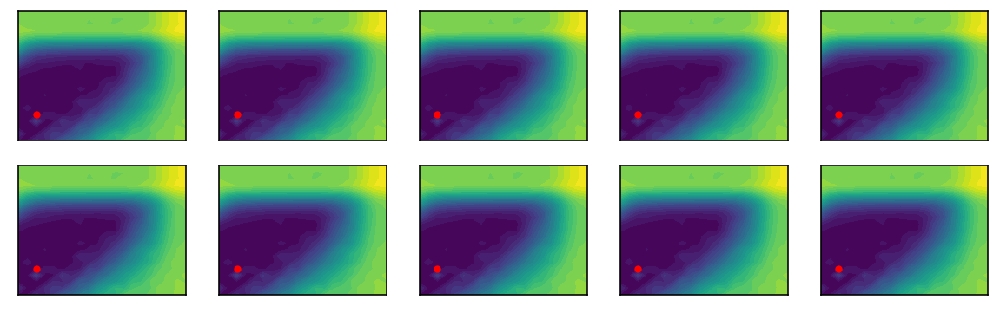

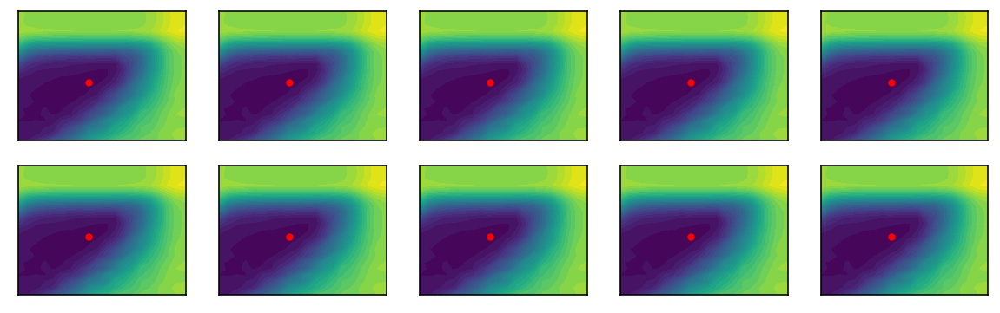

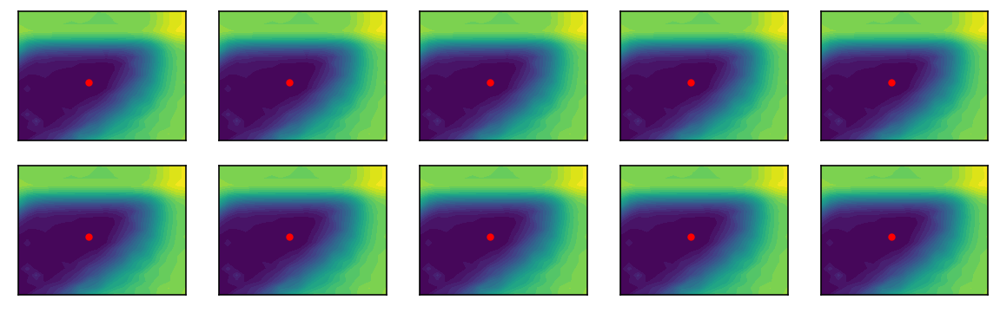

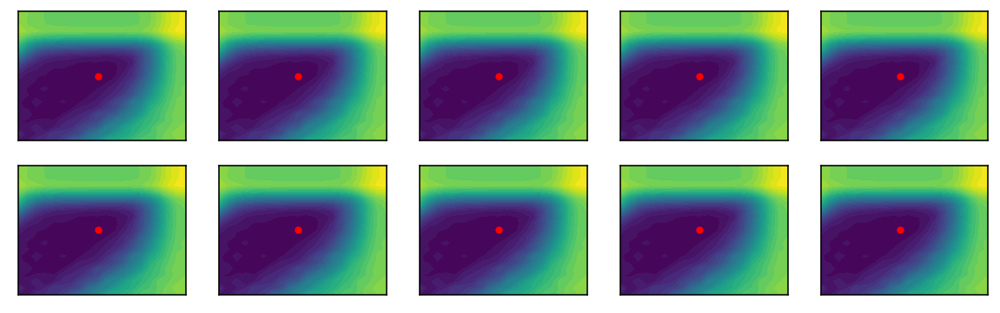

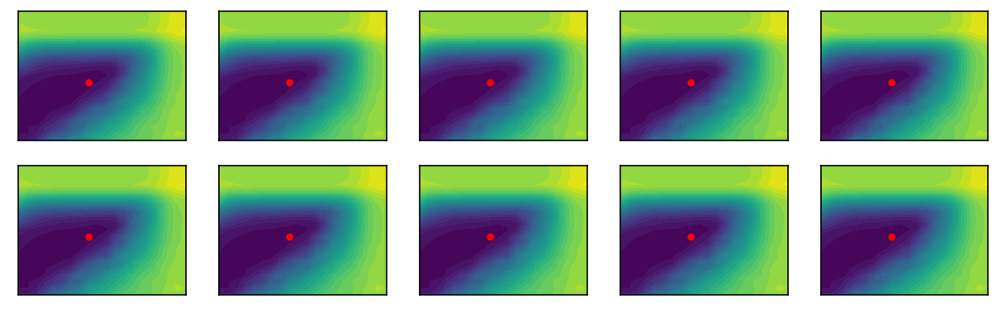

In [40]:
#Run chisq, set rejected genes
 
for i in range(0,len(results)):
    print(i)
    chisq_gen(results[i],EPS=1e-20) #1e-12 too large --> numerical discrepancies b/w obs vs expect freqs
    compute_sigma(results[i])
    chisq_best_param_correction(results[i],overwrite=True,EPS=1e-20) 

In [66]:
for i in range(0,len(results)): 
    print(out_names[i] + ' New params: ', results[i].best_samp_params)
    perc = np.round(np.sum(results[i].gene_rej)/results[i].n_gen,3)*100
    print(out_names[i]+': '+str(np.sum(results[i].gene_rej))+' genes of '+str(results[i].n_gen)+' ('+ str(perc)+'%) have been rejected by chi-square.')
    print()

crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl: 31 genes of 1211 (2.6%) have been rejected by chi-square.

crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl New params:  (-6.894736842105264, -1.525)
crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl: 47 genes of 1580 (3.0%) have been rejected by chi-square.

crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl New params:  (-6.894736842105264, -1.525)
crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl: 59 genes of 1518 (3.9%) have been rejected by chi-square.

crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl: 38 genes of 1045 (3.5999999999999996%) have been rejected by chi-square.

crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl New params:  (-6.894736842105264, -1.525)
crisprsgNegCtrl9

In [42]:
#For each control set best params to those at all-control samp params

s = np.sum(np.array(results[7].sampl_vals) == [-6.894736842105264, -1.525],axis=1)
best_ind = np.where(s == 2)[0][0]

for i in range(0,len(results)):
    if len(results[i].sampl_vals) > 1:   
        results[i].best_samp_params = results[i].sampl_vals[best_ind]
        results[i].best_phys_params = results[i].gene_params[best_ind]
        results[i].best_ind = best_ind
        

#### **Look at parameters fits**

crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl
crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl
crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl
crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl
crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl
crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl
crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl
crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl
crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl


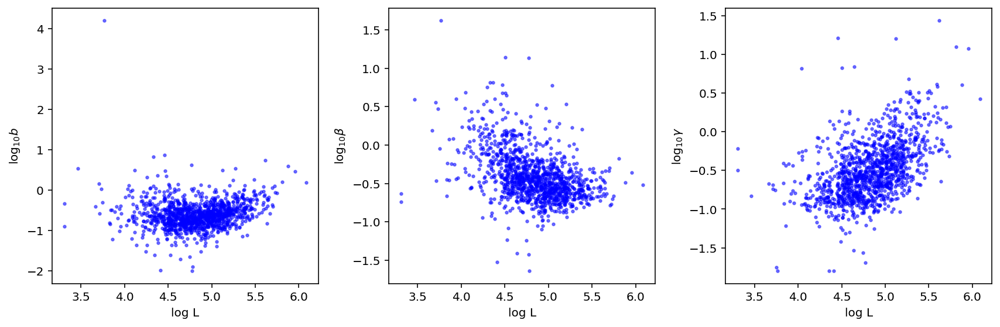

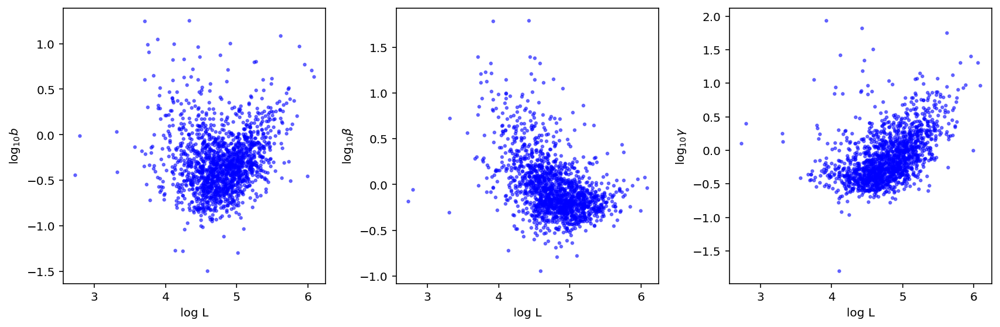

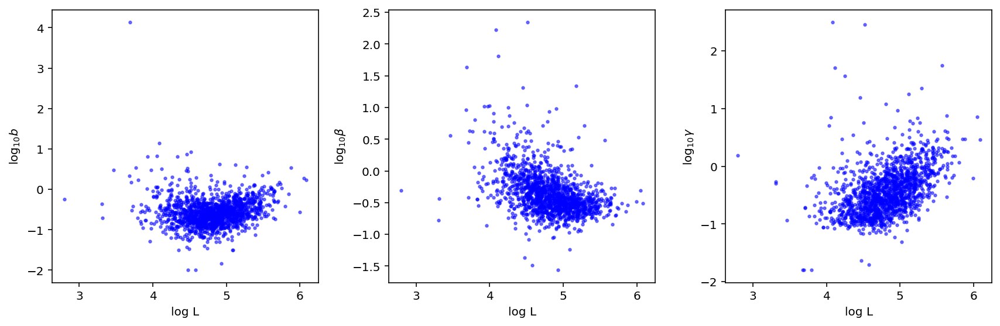

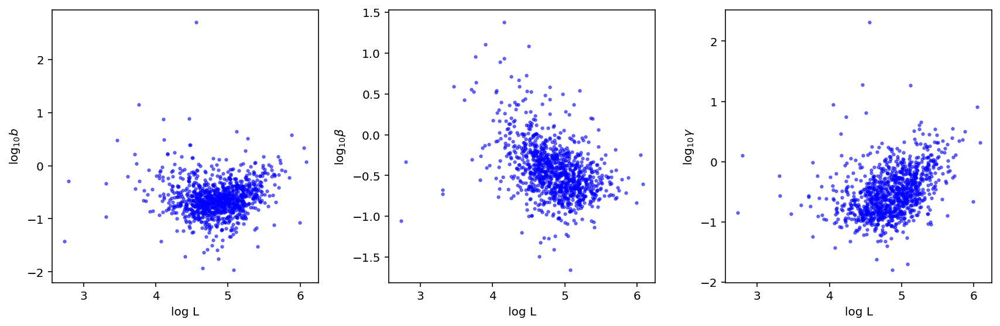

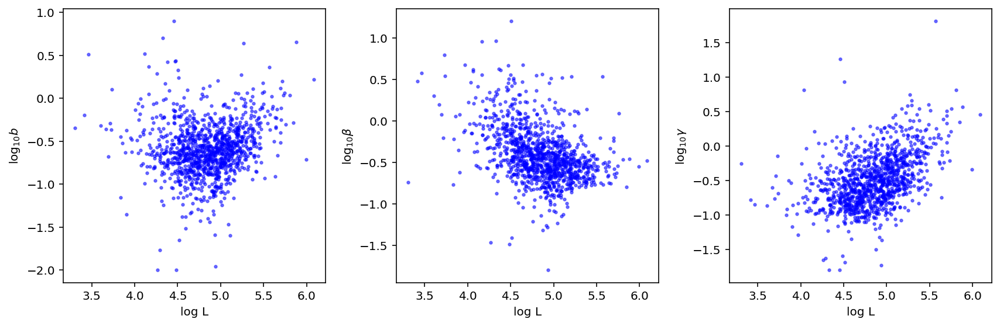

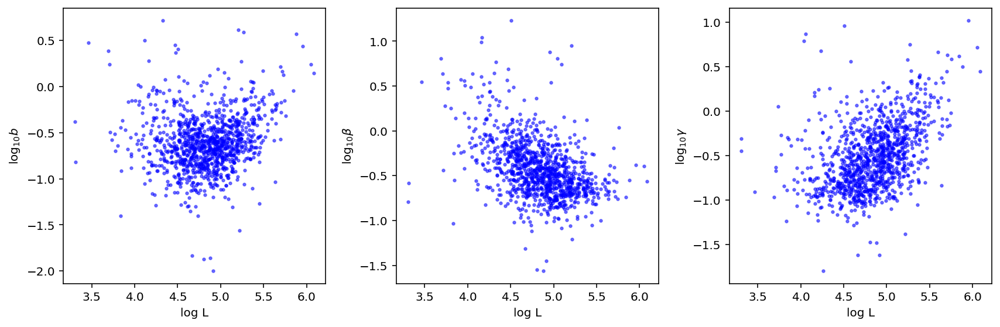

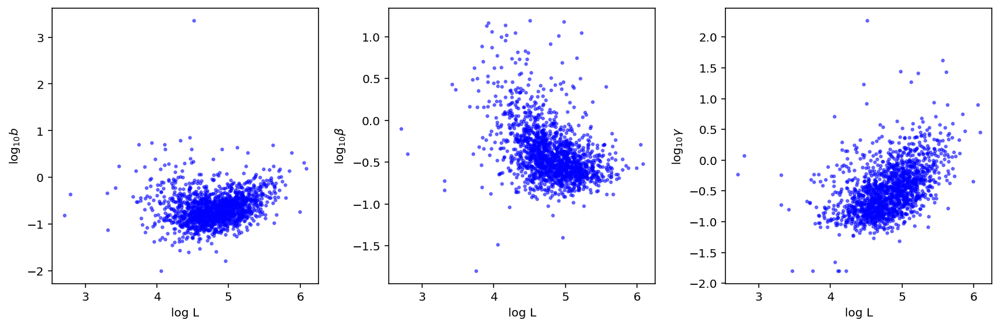

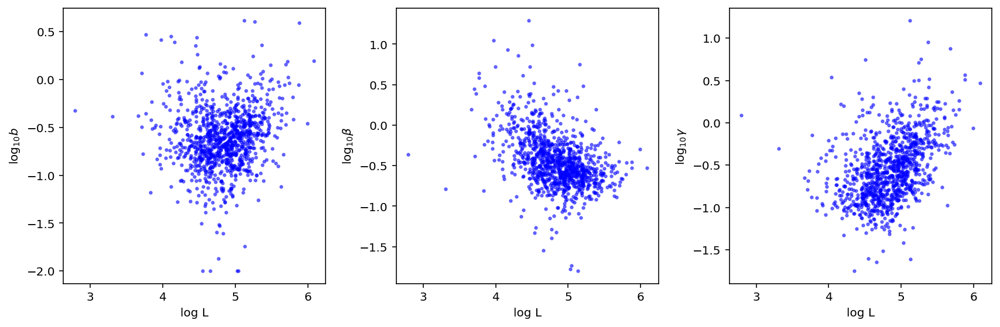

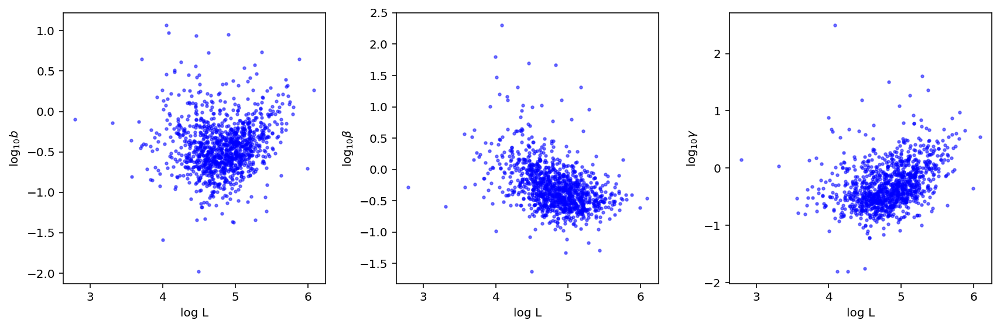

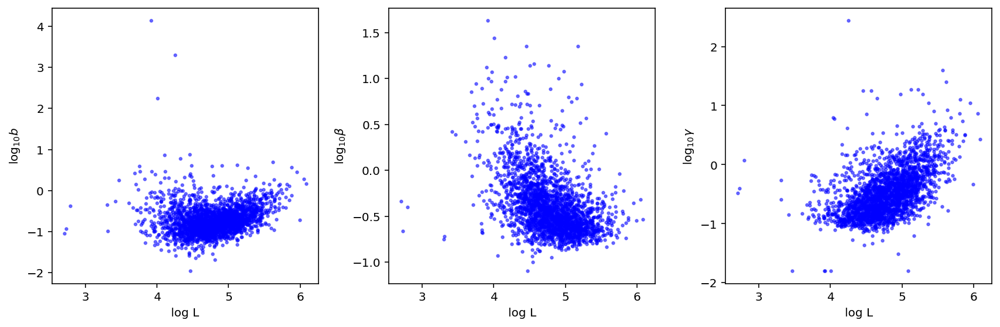

In [18]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False,nosamp=True,chisq_correct=False)  #May see length dependence

crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl
crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl
crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl
crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl
crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl
crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl
crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl
crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl
crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl


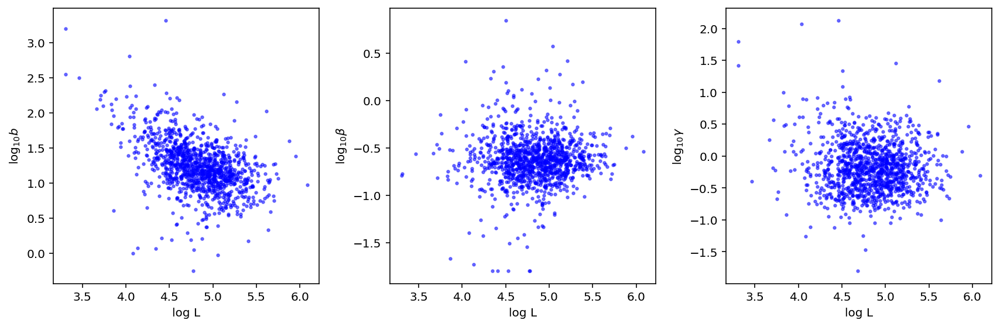

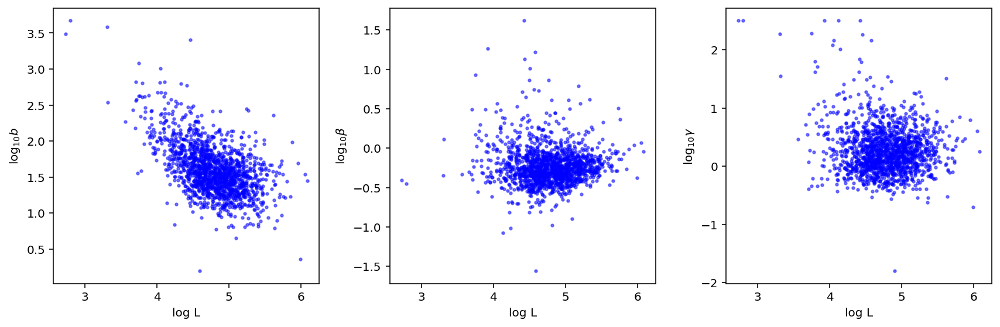

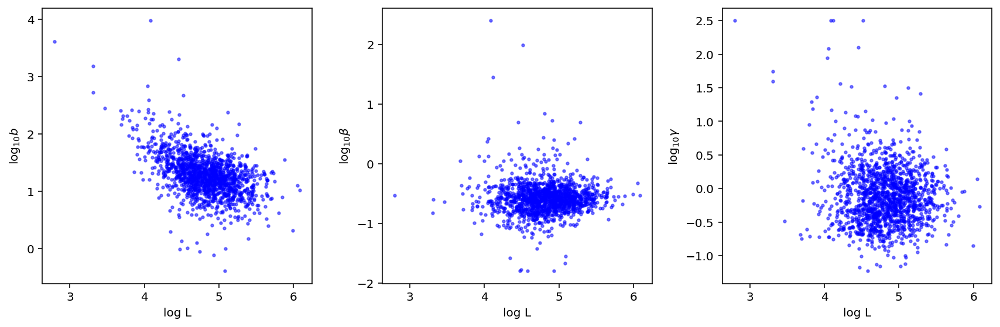

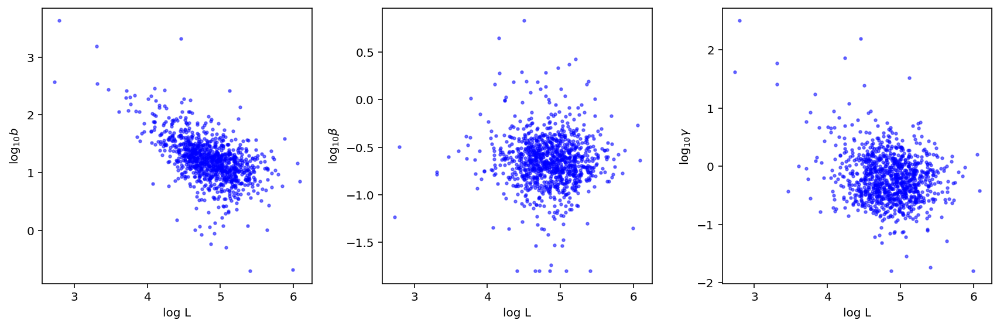

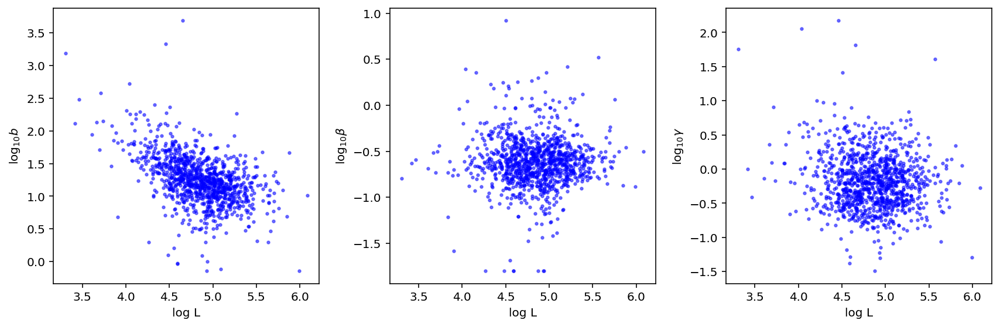

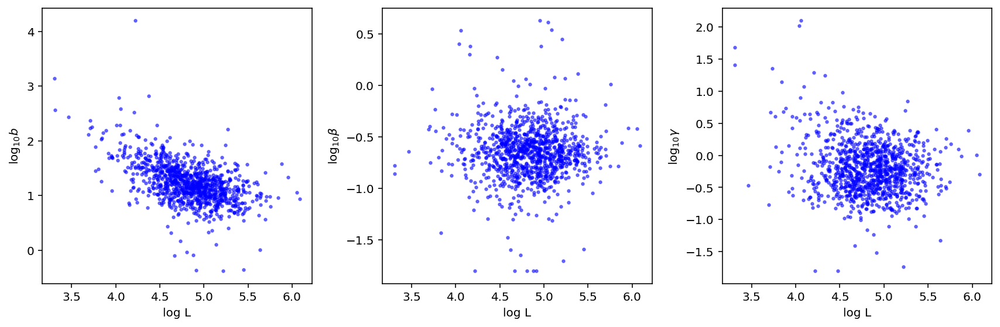

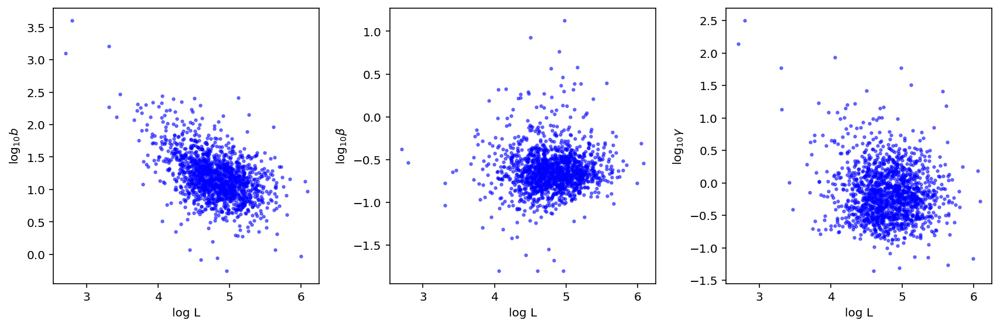

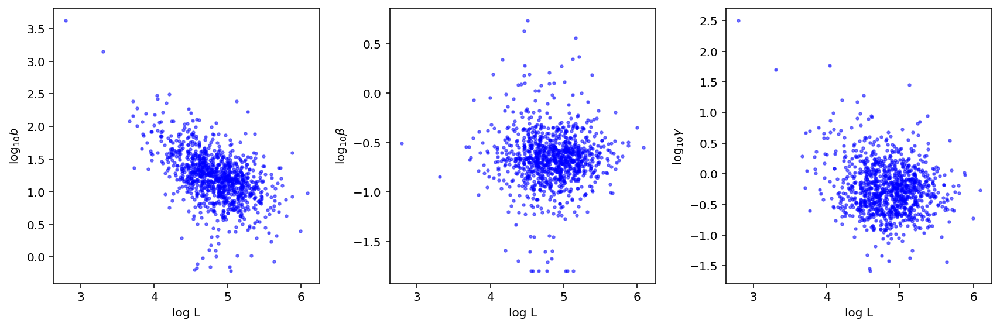

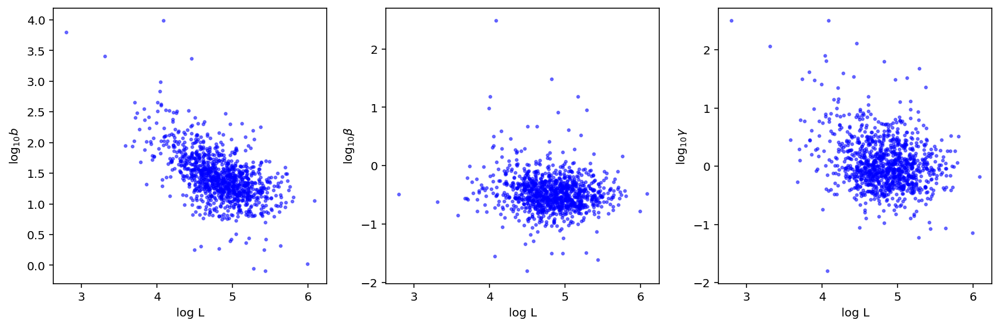

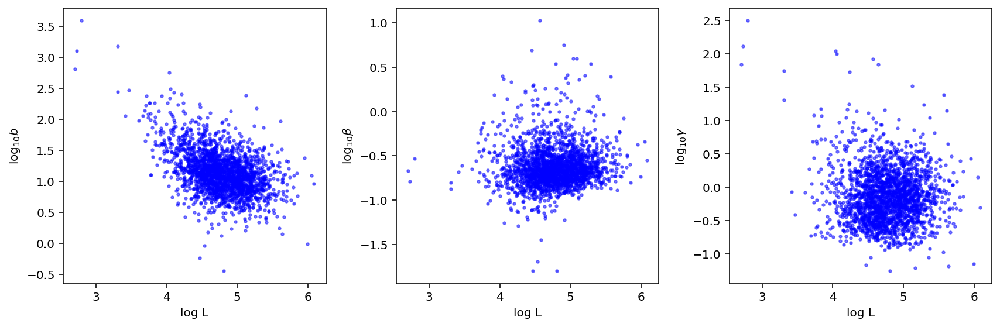

In [19]:
for i in range(0,len(results)):
    print(out_names[i])
    plot_param_L_dep(results[i],plot_errorbars=False)  #Should not see length dep (besides burst size)

In [24]:
#Get errors at end of optimization routine

for i in range(0,len(results)):
    print(out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))


crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl avg KL: 0.03271963084704698
crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl avg KL: 0.036793662033279835
crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl avg KL: 0.02917219871117859
crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl avg KL: 0.04013126370530858
crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl avg KL: 0.04195067676545771
crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl avg KL: 0.04388437419600253
crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl avg KL: 0.018804059056105084
crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl avg KL: 0.04017293774037943
crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl avg KL: 0.05517460458754602
crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl avg KL: 0.007532027044264655


## **Identify Highly Perturbed Genes**
Extract genes with large deviations from the identity line and compare to genes from the study (Replogle et al 2020)

### **Plot of correlations for DE genes from study**

In [43]:
pub_meta = pd.read_csv('~/metadata/Figure2g.csv')
pub_meta.head()

,Unnamed: 0,ENO1,PRDX1,SERBP1,FDPS,MAT2A,HSPD1,HSPE1,NCL,PTMA,...,RPS9,RANBP1,RP11-717F1.1,MT-ND1,MT-ND2,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND6
0,sgHUS1_2a / sgNegCtrl3b,-0.130356,0.002753,-0.148872,-0.040777,-0.029393,-0.047759,-0.093335,-0.117664,-0.140321,...,0.080245,-0.171497,0.159400,0.110976,-0.006594,0.189993,0.013471,0.228624,0.079783,0.037100
1,sgNegCtrl02093a / sgFDPS_2b,-0.899808,-0.929240,-0.758381,-1.122561,0.929940,-0.963508,-0.965116,-0.986381,-1.003163,...,-0.438863,-0.920145,1.383138,-0.305622,-0.315941,-0.545940,-0.814887,-0.683995,-0.391950,-0.722684
2,sgHUS1_2a / sgFDPS_2b,-0.819117,-0.426150,-0.775788,-1.031531,0.037011,-0.827004,-0.900423,-0.821474,-0.736823,...,0.536981,-0.970679,0.859665,-0.245880,-0.312901,-0.332194,-0.619101,-0.571243,-0.332377,-0.487206
3,model prediction,-0.669642,-0.524990,-0.611683,-0.687682,0.493089,-0.605716,-0.661888,-0.703476,-0.740488,...,-0.152228,-0.731086,0.979659,-0.039212,-0.187626,-0.080044,-0.446978,-0.111698,-0.126116,-0.365907
4,difference,-0.149475,0.098840,-0.164105,-0.343849,-0.456078,-0.221288,-0.238535,-0.117998,0.003665,...,0.689208,-0.239593,-0.119994,-0.206668,-0.125275,-0.252150,-0.172123,-0.459545,-0.206262,-0.121299


In [44]:
print(len(results[0].gene_names))

1211


In [45]:
# remain = np.array(results[0].gene_names)[~results[0].gene_rej & ~check_at_bounds(results[0],results[0].best_phys_params)]


In [46]:
names = pub_meta.columns.tolist()[1:]
print(len(names))

50


In [47]:
gnames = [i for i in names if (i in results[3].gene_names and i in results[1].gene_names and i in results[8].gene_names)]
len(gnames)

6

In [98]:
# #crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b
# import loompy
# looms = loompy.connect('/home/tchari/counts/replogle_crispr/loom/crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b.loom')
# looms.ra.keys()

# gene_names = looms.ra['Gene']

# S = looms.layers['spliced'].sparse()

# U = looms.layers['unspliced'].sparse()

# looms.close()

# S_max = np.amax(S,1)
# U_max = np.amax(U,1)
# S_mean = np.mean(S,1)
# U_mean = np.mean(U,1)        

In [24]:
# for i in [i for i in names if i not in remain]:
#     find = gene_names == i
    
#     print(np.array(U_mean)[find],np.array(S_mean)[find],
#           np.array(S_max.todense())[find], np.array(U_max.todense())[find] )

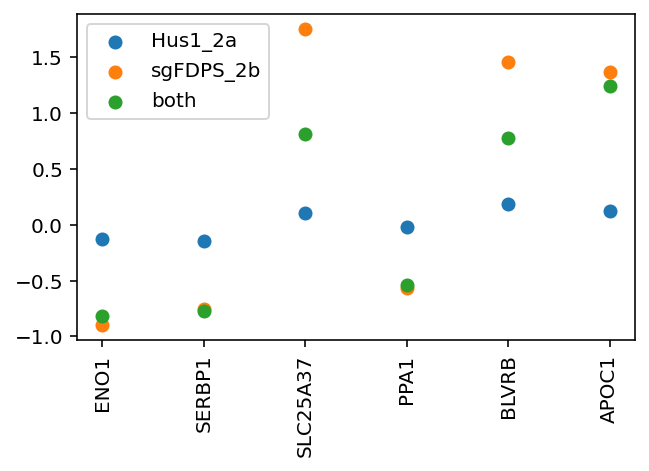

In [36]:
#Plot DE genes z-scored expression

hus = np.array(pub_meta[gnames])[0,:]
sgFDPS = np.array(pub_meta[gnames])[1,:]
both = np.array(pub_meta[gnames])[2,:]

plt.figure(figsize=(5,3))
plt.scatter(gnames,hus,label='Hus1_2a')
plt.scatter(gnames,sgFDPS,label='sgFDPS_2b')
plt.scatter(gnames,both,label='both')
plt.xticks(rotation=90)
plt.legend()
plt.show()


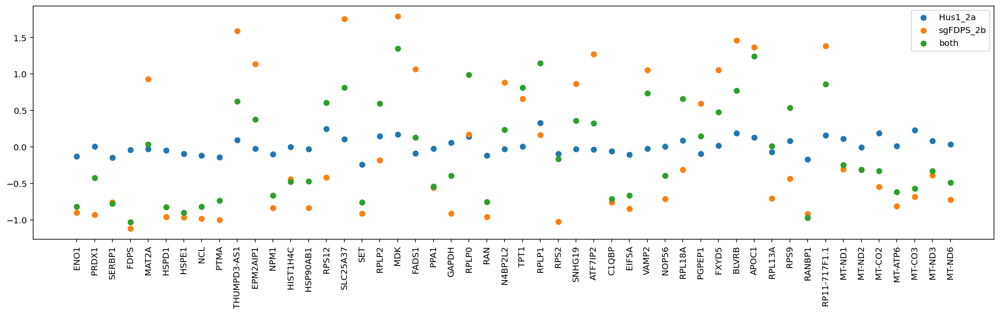

In [33]:
#Plot DE genes z-scored expression

hus = np.array(pub_meta[names])[0,:]
sgFDPS = np.array(pub_meta[names])[1,:]
both = np.array(pub_meta[names])[2,:]

plt.figure(figsize=(20,5))
plt.scatter(names,hus,label='Hus1_2a')
plt.scatter(names,sgFDPS,label='sgFDPS_2b')
plt.scatter(names,both,label='both')
plt.xticks(rotation=90)
plt.legend()
plt.show()


## **Assess correlation of Perturbed Fits**
Compare individual perturbed and control sample correlations to combined control

In [48]:
c_highlight = col_red
c1 = [173/255,214/255,200/255]
c2 = [59/255,131/255,130/255]
ncol=20
cmap = ListedColormap(np.array([np.linspace(c2[j],c1[j],ncol) for j in range(3)]).T)

In [49]:
rep_pairs = []

for i in range(len(results)):
    rep_pairs += [(i,3)]

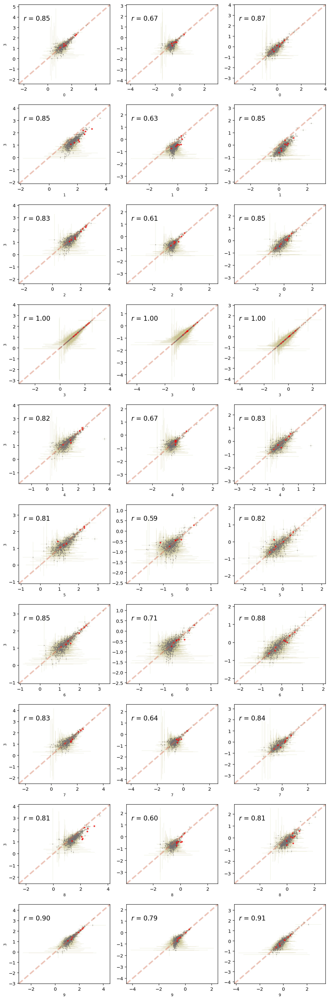

In [157]:
ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=len(rep_pairs),ncols=3,figsize=(10,30))

nbin=30
for i in range(len(rep_pairs)):
    K = rep_pairs[i]
    #print(looms[K[0]])
    res1 = results[K[0]]#import_precomputed_(results[K[0]])


    #print(looms[K[1]])
    res2 = results[K[1]]#import_precomputed_(results[K[1]])
    #chisq_gen(res2)

    err1 = res1.sigma*1.645#2.576
    err2 = res2.sigma*1.645#2.576


    for j in range(3):

#         filt = ~res1.gene_rej & ~res2.gene_rej \
#             & ~check_at_bounds(res1,res1.best_phys_params)\
#             & ~check_at_bounds(res2,res2.best_phys_params)
        
#         ax1[i,j].scatter(res1.best_phys_params[filt,j],
#                    res2.best_phys_params[filt,j],color=col_gray,alpha=alf_fail,s=ms_fail)
    
        #print(res1.best_phys_params[filt,j].shape)
        
        
        remain1 = np.array(res1.gene_names)[~res1.gene_rej & ~check_at_bounds(res1,res1.best_phys_params)]

        remain2 = np.array(res2.gene_names)[~res2.gene_rej & ~check_at_bounds(res2,res2.best_phys_params)]

        remain = list(set(remain1).intersection(remain2))

        filt1 = [res1.gene_names.index(i) for i in remain]
        filt2 = [res2.gene_names.index(i) for i in remain]
    
    
        ax1[i,j].scatter(res1.best_phys_params[filt1,j],
                   res2.best_phys_params[filt2,j],color=col_gray,alpha=alf_fail,s=ms_fail)
        
        ax1[i,j].errorbar(res1.best_phys_params[filt1,j],
            res2.best_phys_params[filt2,j],
            err1[filt1,j],err2[filt2,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)
        

        #Get max limits
        maxY = max(ax1[i,j].get_ylim())
        maxX = max(ax1[i,j].get_xlim())
        
        minY = min(ax1[i,j].get_ylim())
        minX = min(ax1[i,j].get_xlim())
        
        plotMax = max([maxY,maxX])
        plotMin = min([minY,minX])
        
        ax1[i,j].set_xlim([plotMin,plotMax])
        ax1[i,j].set_ylim([plotMin,plotMax])
        

        fs=14
        sml=8
        rho=np.corrcoef(res1.best_phys_params[filt1,j],res2.best_phys_params[filt2,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(str(K[0]),fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel(str(K[1]),fontsize=sml)
        ax1[i,j].text(.05,.8,r'$r$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)
        
        ax1[i,j].scatter(res1.best_phys_params[filt1,j][pd.Categorical(remain).isin(names)],
                         res2.best_phys_params[filt2,j][pd.Categorical(remain).isin(names)],
                         color='red',alpha=0.6,s=7)
        
   



fig1.tight_layout()
fig1.savefig('allSampCorrs.pdf')

In [25]:
for i in range(len(results)):
    print(str(i),': ',out_names[i])

0 :  crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl
1 :  crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl
2 :  crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl
3 :  crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl
4 :  crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl
5 :  crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl
6 :  crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl
7 :  crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl
8 :  crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl
9 :  crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl


In [158]:
rep_pairs = []

for i in range(len(results)):
    rep_pairs += [(i,3)]

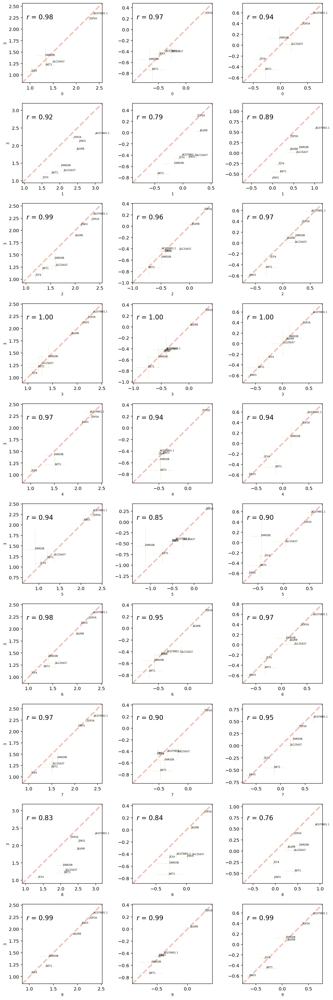

In [159]:
#-7.333333333333333,-0.14999999999999947

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=len(rep_pairs),ncols=3,figsize=(10,30))
nbin=30
for i in range(len(rep_pairs)):
    K = rep_pairs[i]
    #print(looms[K[0]])
    res1 = results[K[0]]#import_precomputed_(results[K[0]])


    #print(looms[K[1]])
    res2 = results[K[1]]#import_precomputed_(results[K[1]])
    #chisq_gen(res2)

    err1 = res1.sigma*1.645#2.576
    err2 = res2.sigma*1.645#2.576


    for j in range(3):

        
        remain1 = np.array(res1.gene_names)[~res1.gene_rej & ~check_at_bounds(res1,res1.best_phys_params)]
        remain1 = remain1[pd.Categorical(remain1).isin(names)]

        remain2 = np.array(res2.gene_names)[~res2.gene_rej & ~check_at_bounds(res2,res2.best_phys_params)]
        remain2 = remain2[pd.Categorical(remain2).isin(names)]

        remain = list(set(remain1).intersection(remain2))

        filt1 = [res1.gene_names.index(i) for i in remain]
        filt2 = [res2.gene_names.index(i) for i in remain]
        

        ax1[i,j].scatter(res1.best_phys_params[filt1,j],
                   res2.best_phys_params[filt2,j],color=col_gray,alpha=alf_fail,s=ms_fail)
        
        ax1[i,j].errorbar(res1.best_phys_params[filt1,j],
            res2.best_phys_params[filt2,j],
            err1[filt1,j],err2[filt2,j],marker=markerstyle,ms=ms,c=col_gold,alpha=0.4,linestyle='None',linewidth=lw,zorder=-100)


    
        n = remain
        for p, txt in enumerate(n):
            ax1[i,j].annotate(txt, (res1.best_phys_params[filt1,j][p],res2.best_phys_params[filt2,j][p]),
                             fontsize=5)
    

        #Get max limits
        maxY = max(ax1[i,j].get_ylim())
        maxX = max(ax1[i,j].get_xlim())
        
        minY = min(ax1[i,j].get_ylim())
        minX = min(ax1[i,j].get_xlim())
        
        plotMax = max([maxY,maxX])
        plotMin = min([minY,minX])
        
        ax1[i,j].set_xlim([plotMin,plotMax])
        ax1[i,j].set_ylim([plotMin,plotMax])
        
        
        fs=14
        sml=8
        rho=np.corrcoef(res1.best_phys_params[filt1,j],res2.best_phys_params[filt2,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(str(K[0]),fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel(str(K[1]),fontsize=sml)
        ax1[i,j].text(.05,.8,r'$r$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)
        
        

fig1.tight_layout()
fig1.savefig('allSampCorrsDEGOnly.pdf')

In [168]:
for i in range(len(results)):
    print(str(i),': ',out_names[i])

0 :  crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl
1 :  crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl
2 :  crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl
3 :  crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl
4 :  crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl
5 :  crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl
6 :  crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl
7 :  crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl
8 :  crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl
9 :  crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl


### **Look at KL div for predicted histograms**

In [67]:
for i in range(0,len(results)):
    print(str(i)+' '+out_names[i]+' avg KL: '+str(np.mean(results[i].gene_spec_err[results[i].best_ind])))


0 crisprsgNegCtrl4a_sgNegCtrl3b_20x21_1211gen_1/result.pickl avg KL: 0.03271963084704698
1 crisprsgHUS1_2a_sgFDPS_2b_20x21_1580gen_1/result.pickl avg KL: 0.036793662033279835
2 crisprsgHUS1_2a_sgNegCtrl3b_20x21_1518gen_1/result.pickl avg KL: 0.02917219871117859
3 crisprsgNegCtrl5a_sgNegCtrl3b_20x21_1045gen_1/result.pickl avg KL: 0.04013126370530858
4 crisprsgNegCtrl9a_sgNegCtrl3b_20x21_1112gen_1/result.pickl avg KL: 0.04195067676545771
5 crisprsgNegCtrl1a_sgNegCtrl3b_20x21_1087gen_1/result.pickl avg KL: 0.04388437419600253
6 crisprsgNegCtrl02093a_sgNegCtrl3b_20x21_1595gen_1/result.pickl avg KL: 0.018804059056105084
7 crisprsgNegCtrl8a_sgNegCtrl3b_20x21_1027gen_1/result.pickl avg KL: 0.04017293774037943
8 crisprsgNegCtrl02093a_sgFDPS_2b_20x21_1130gen_1/result.pickl avg KL: 0.05517460458754602
9 crisprsgNegCtrl02093a_sgNegCtrl3b_sgNegCtrl4a_sgNegCtrl3b_sgNegCtrl8a_sgNegCtrl3b_sgNegCtrl5a_sgNegCtrl3b_sgNegCtrl1a_sgNegCtrl3b_sgNegCtrl9a_sgNegCtrl3b_20x21_2338gen_1/result.pickl avg KL: 0.00

In [68]:
results[0].gene_spec_err[results[0].best_ind][0]

0.026909804026255688

## **Test log-additive/multiplicative prediction model**

In [ ]:
# z-CTRL = a-CTRL + b-CTRL where z=log(param_ab), a=log(param_a),b=log(param_b), CTRL=log(param_CTRL)
#Assuming fold changes have cumulative effect

Set parameters and gene filters for model

In [50]:
hus_res = results[2]
sg_res = results[8]
both_res = results[1]
ctrl_res = results[3]

#Filtered for genes shared by all samples
forFilt = [hus_res,sg_res,both_res,ctrl_res]


remain1 = np.array(forFilt[0].gene_names)[~forFilt[0].gene_rej & ~check_at_bounds(forFilt[0],forFilt[0].best_phys_params)] #~forFilt[0].gene_rej &
remainAll = remain1
#remain1 = remain1[pd.Categorical(remain1).isin(names)]

filts = []
for i in forFilt[1:]:

    remain2 = np.array(i.gene_names)[~i.gene_rej & ~check_at_bounds(i,i.best_phys_params)] #~i.gene_rej & 
    #remain2 = remain2[pd.Categorical(remain2).isin(names)]

    remainAll = list(set(remainAll).intersection(remain2))

for i in range(len(forFilt)):
    filts += [[forFilt[i].gene_names.index(x) for x in remainAll]]

#Get only DE genes from study
remainAllSub = np.array(remainAll)[pd.Categorical(remainAll).isin(names)]


filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[forFilt[i].gene_names.index(x) for x in remainAllSub]]

    
        

In [51]:
#Fit model for all params and plot FC correlations to fit data

#MODEL

z = (hus_res.best_phys_params[filts[0],:] - ctrl_res.best_phys_params[filts[3],:]) + (sg_res.best_phys_params[filts[1],:] - ctrl_res.best_phys_params[filts[3],:])

#Get previously fit parameter vaues,'ground truth'
true = (both_res.best_phys_params[filts[2],:] - ctrl_res.best_phys_params[filts[3],:])

In [52]:
#Fit model just for DE Genes

#MODEL

z_sub = (hus_res.best_phys_params[filtsSub[0],:] - ctrl_res.best_phys_params[filtsSub[3],:]) + (sg_res.best_phys_params[filtsSub[1],:] - ctrl_res.best_phys_params[filtsSub[3],:])

#Get previously fit parameter vaues,'ground truth'
true_sub = (both_res.best_phys_params[filtsSub[2],:] - ctrl_res.best_phys_params[filtsSub[3],:])


In [ ]:
#Check that values line up

**Histogram fits for DE genes in perturbed samples**

In [53]:
def plot_genes_(result_data,sz,figsize,marg='none',log=False,title=True,nosamp=False,GEN_PLOT=None,cmap='summer'):
    (nrows,ncols)=sz
    fig1,ax1=plt.subplots(nrows=nrows,ncols=ncols,figsize=figsize)

    plt.subplots_adjust(wspace=0.8, 
                    hspace=2)
    if GEN_PLOT is None:
        NGEN_PLOT = np.prod(sz)
    for i_ in range(len(GEN_PLOT)):
        ind = GEN_PLOT[i_]
        lm = [result_data.M[ind],result_data.N[ind]]
        axis_location = np.unravel_index(i_,sz)
        
        samp = None if nosamp else result_data.gene_spec_samp_params[ind]
        Pa = np.squeeze(cme_integrator(result_data.best_phys_params[ind],lm,samp))

        if log and marg == 'none':
            Pa[Pa<1e-8]=1e-8
            Pa = np.log10(Pa)
        #ax1[axis_location].set_xticks([])
        #ax1[axis_location].set_yticks([])
        if marg=='none':
            X_,Y_ = np.meshgrid(np.arange(result_data.M[ind])-0.5,
                                np.arange(result_data.N[ind])-0.5)
            ax1[axis_location].contourf(X_.T,Y_.T,Pa,20,cmap=cmap)
            jitter_magn = 0.1
            jitter_x = np.random.randn(result_data.Ncells)*jitter_magn
            jitter_y = np.random.randn(result_data.Ncells)*jitter_magn
            ax1[axis_location].scatter(result_data.raw_U[ind]+jitter_x,
                                       result_data.raw_S[ind]+jitter_y,c='k',s=1,alpha=0.1)
            
            ax1[axis_location].set_xlim([-0.5,result_data.M[ind]-1.5])
            ax1[axis_location].set_ylim([-0.5,result_data.N[ind]-1.5])
            ax1[axis_location].text(.05,.8,result_data.gene_names[ind],transform=ax1[axis_location].transAxes,fontsize=20)
            ax1[axis_location].text(.05,.65,'KLD: '+
                                    '{:0.4f}'.format(result_data.gene_spec_err[result_data.best_ind][ind]),
                                    transform=ax1[axis_location].transAxes,fontsize=15)
            
        fs=20
        if axis_location[0]==1:
            ax1[axis_location].set_xlabel('Unspliced',fontsize=fs)
        if axis_location[1]==0:
            ax1[axis_location].set_ylabel('Spliced',fontsize=fs)
    fig1.tight_layout(pad=0.02)

In [73]:
len(remainAllSub)

6

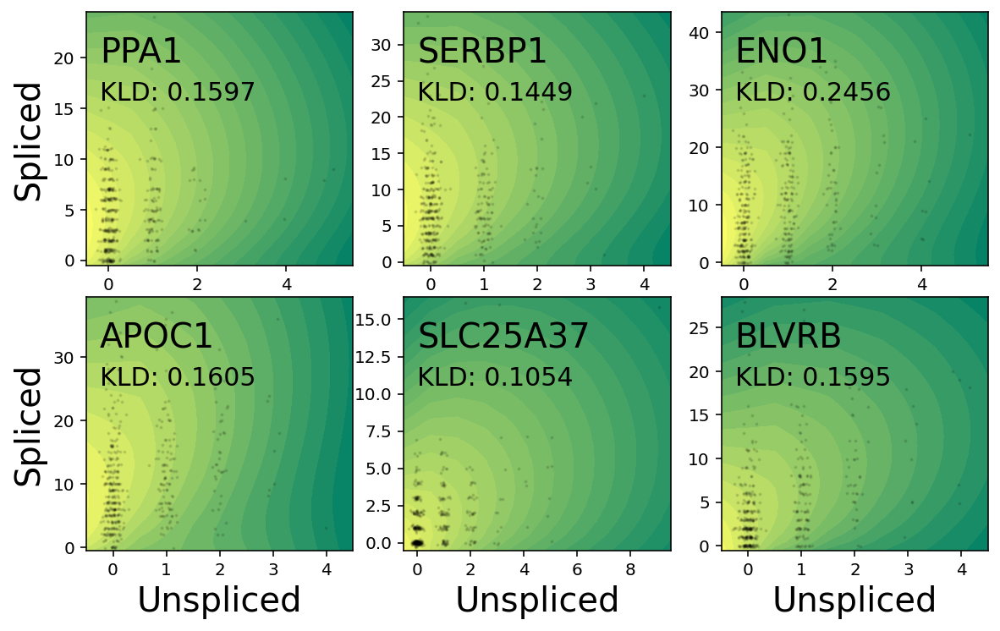

In [74]:
plot_genes_(sg_res,(2,3),(8,5),log=True,GEN_PLOT=[sg_res.gene_names.index(x) for x in remainAllSub])

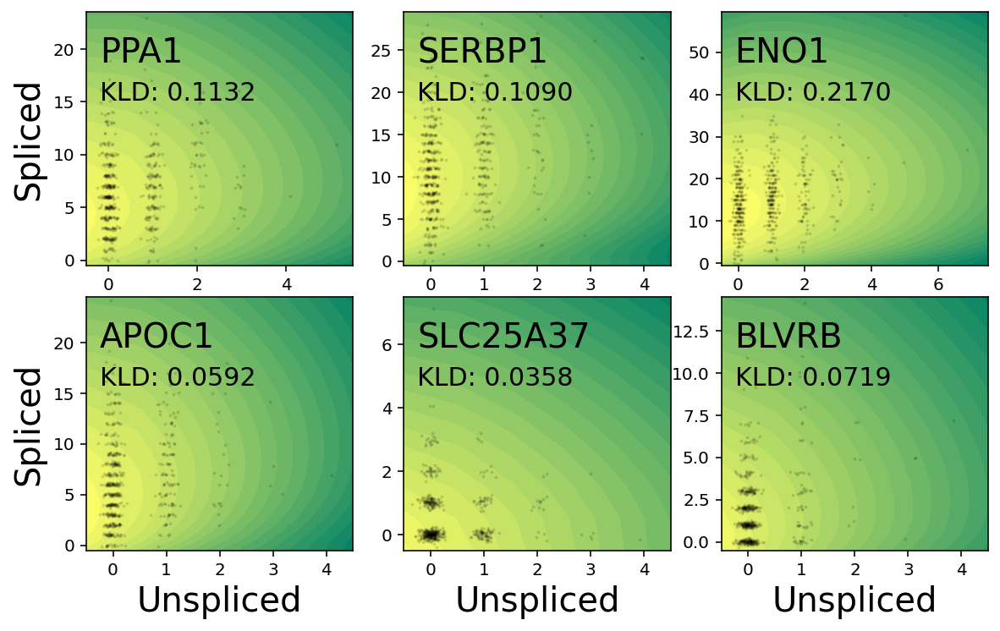

In [75]:
plot_genes_(ctrl_res,(2,3),(8,5),log=True,GEN_PLOT=[ctrl_res.gene_names.index(x) for x in remainAllSub])

### **Plot Predicted Delta Correlations to Fit Delta**
See if predicted deltas/fold changes in parameter values match up

In [54]:
from scipy import stats

**Get error bars**

In [55]:
#Concatenate all best_phys_params and all gene_names list

res = [results[0],results[3],results[4],results[6],results[7],results[9]]

allNames = []
allZs = []
allTrue = []

for r in res:
    
    forFilt = [hus_res,sg_res,both_res,r]
    
    remain1 = np.array(forFilt[0].gene_names) #~forFilt[0].gene_rej &
    remainAll2 = remain1

    filts2 = []
    for i in forFilt:

        remain2 = np.array(i.gene_names) #~i.gene_rej & 
        #remain2 = remain2[pd.Categorical(remain2).isin(names)]

        remainAll2 = list(set(remainAll2).intersection(remain2))
        
    allNames += remainAll2

    for i in range(len(forFilt)):
        filts2 += [[forFilt[i].gene_names.index(x) for x in remainAll2]]
    
    allZs += [(hus_res.best_phys_params[filts2[0],:] - r.best_phys_params[filts2[3],:]) + (sg_res.best_phys_params[filts2[1],:] - r.best_phys_params[filts2[3],:])]
    allTrue += [(both_res.best_phys_params[filts2[2],:] - r.best_phys_params[filts2[3],:])]


#For each gene get std dev from it values in list

In [56]:
allPreds = np.concatenate(allZs)
allTrues = np.concatenate(allTrue)

allPreds = np.log2(10**allPreds)
allTrues = np.log2(10**allTrues)

In [57]:
allPreds.shape

(4304, 3)

In [58]:
allTrues.shape

(4304, 3)

In [59]:
pd.Categorical(allNames).isin([allNames[0]])

array([ True, False, False, ..., False, False, False])

In [60]:
err_mat = np.zeros((len(remainAll),3))
for gene in range(len(remainAll)): #Genes from original plotting list
    
    ind = pd.Categorical(allNames).isin([remainAll[gene]])
    var = np.var(allPreds[ind,:],axis=0)
    
    err_mat[gene,:] = np.sqrt(var)
    
    
    

In [61]:
err_true = np.zeros((len(remainAll),3))
for gene in range(len(remainAll)): #Genes from original plotting list
    
    ind = pd.Categorical(allNames).isin([remainAll[gene]])
    var = np.var(allTrues[ind,:],axis=0)
    
    err_true[gene,:] = np.sqrt(var)
    
    
    

**Plot Delta Correlations to Fit Deltas**

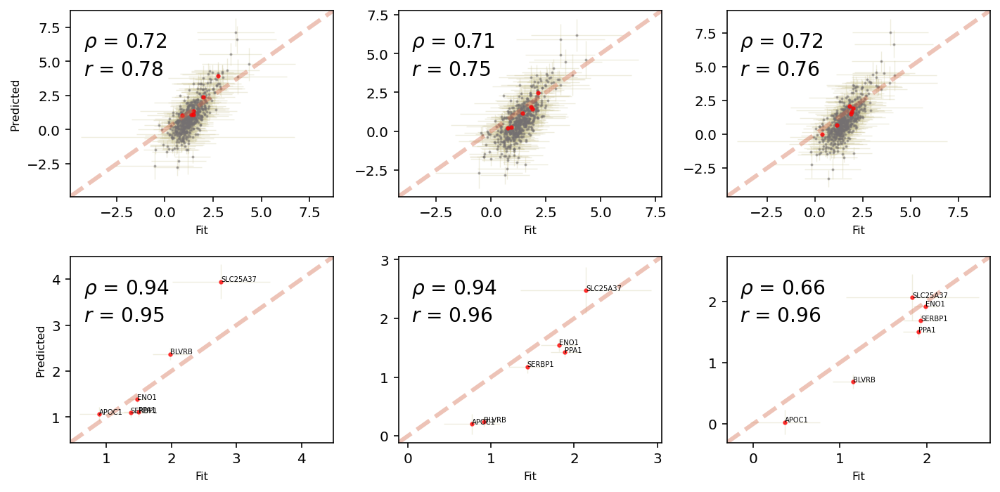

In [62]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30


#err for Fit params = sqrt(2)*err.sigma

i=0
for j in range(3):


# ------- ADD ERROR BARS -----------------

    ax1[i,j].errorbar(np.log2(10**true[:,j]),np.log2(10**z[:,j]),
        err_true[:,j],err_mat[:,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    ax1[i,j].scatter(np.log2(10**true[:,j]),np.log2(10**z[:,j]),color=col_gray,alpha=alf_fail,s=ms_fail)

    #filtNames = np.array(hus_res.gene_names)[filt]
    n = remainAllSub
    for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (z[filtDE,j][p],true[filtDE,j][p]),
#                          fontsize=5)
        
        ax1[i,j].scatter(np.log2(10**true_sub[p,j]),np.log2(10**z_sub[p,j]),color='red',alpha=0.7,s=5)


    #Get max limits
    maxY = max(ax1[i,j].get_ylim())
    maxX = max(ax1[i,j].get_xlim())

    minY = min(ax1[i,j].get_ylim())
    minX = min(ax1[i,j].get_xlim())

    plotMax = max([maxY,maxX])
    plotMin = min([minY,minX])

    ax1[i,j].set_xlim([plotMin,plotMax])
    ax1[i,j].set_ylim([plotMin,plotMax])

    fs=14
    sml=8
    rho,pvals=stats.spearmanr(np.log2(10**z[:,j]),np.log2(10**true[:,j]))
    pr = np.corrcoef(np.log2(10**z[:,j]),np.log2(10**true[:,j]))[0][1]
    xl = ax1[i,j].get_xlim()
    ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)
    ax1[i,j].text(.05,0.65,r'$r$ = {:.2f}'.format(pr),fontsize=fs,transform=ax1[i,j].transAxes)
    
    
    #------ bottom plot -------
    nameFilt = [list(remainAll).index(n) for n in remainAllSub]
    
    ax1[i+1,j].errorbar(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]),
        err_true[nameFilt,j],err_mat[nameFilt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)
    
    ax1[i+1,j].scatter(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]),color='red',alpha=0.7,s=5)
    
    #Get max limits
    maxY = max(ax1[i+1,j].get_ylim())
    maxX = max(ax1[i+1,j].get_xlim())

    minY = min(ax1[i+1,j].get_ylim())
    minX = min(ax1[i+1,j].get_xlim())

    plotMax = max([maxY,maxX])
    plotMin = min([minY,minX])

    ax1[i+1,j].set_xlim([plotMin,plotMax])
    ax1[i+1,j].set_ylim([plotMin,plotMax])
        
    
    fs=14
    sml=8
    rho,pvals=stats.spearmanr(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]))
    pr = np.corrcoef(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]))[0][1] #DO SPEARMAN RANK CORRELATION
    xl = ax1[i+1,j].get_xlim()
    ax1[i+1,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i+1,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i+1,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i+1,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i+1,j].transAxes)
    ax1[i+1,j].text(.05,0.65,r'$r$ = {:.2f}'.format(pr),fontsize=fs,transform=ax1[i+1,j].transAxes)
    
    n = remainAllSub
    for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (z[filtDE,j][p],true[filtDE,j][p]),
#                          fontsize=5)
        
        ax1[i+1,j].annotate(txt, (np.log2(10**true_sub[p,j]),np.log2(10**z_sub[p,j])),
                         fontsize=5)

    


fig1.tight_layout()
fig1.savefig('allPredCorrs.pdf')

Plot predicted (fit) fold changes per parameter

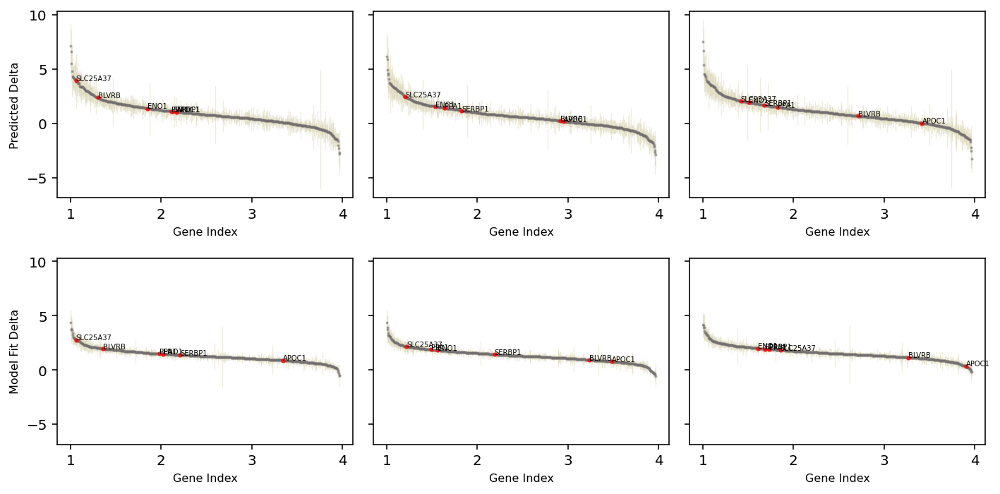

In [50]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5),sharey=True)
nbin=30

i=0
for j in range(3):


#     ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#         res2.best_phys_params[filt,j],
#         err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    x1 = range(z.shape[0])
    y1 = z[:,j]
    
    indices = np.argsort(np.array(y1))[::-1]
    
    #x1 = np.array(x1)[indices]
    y1 = np.array(y1)[indices]
    
    sortNames = np.array(remainAll)[indices]
    
    ax1[i,j].errorbar(x1,np.log2(10**y1),
         err_mat[indices,j],err_mat[indices,j]/100,marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    ax1[i,j].scatter(x1,np.log2(10**y1),color=col_gray,alpha=alf_fail,s=ms_fail)

    #filtNames = np.array(hus_res.gene_names)[filt]
    n = remainAllSub
    for p, txt in enumerate(n):
        ax1[i,j].annotate(txt, (sortNames.tolist().index(txt),np.log2(10**z_sub[p,j])),
                         fontsize=5)
        
        ax1[i,j].scatter(sortNames.tolist().index(txt),np.log2(10**z_sub[p,j]),color='red',alpha=0.7,s=5)



    fs=14
    sml=8

    ax1[i,j].set_xlabel('Gene Index',fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Predicted Delta',fontsize=sml)
        
    ax1[i,j].set_xticklabels(x1)

        
    x1 = range(true.shape[0])
    y1 = true[:,j]
    
    indices = np.argsort(np.array(y1))[::-1]
    
    #x1 = np.array(x1)[indices]
    y1 = np.array(y1)[indices]
    
    sortNames = np.array(remainAll)[indices]

    
    ax1[i+1,j].errorbar(x1,np.log2(10**y1),
        err_true[indices,j],err_true[indices,j]/100,marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)

    
    ax1[i+1,j].scatter(x1,np.log2(10**y1),color=col_gray,alpha=alf_fail,s=ms_fail)

    #filtNames = np.array(hus_res.gene_names)[filt]
    n = remainAllSub
    for p, txt in enumerate(n):
        ax1[i+1,j].annotate(txt, (sortNames.tolist().index(txt),np.log2(10**true_sub[p,j])),
                         fontsize=5)
        ax1[i+1,j].scatter(sortNames.tolist().index(txt),np.log2(10**true_sub[p,j]),color='red',alpha=0.7,s=5)



    fs=14
    sml=8

    ax1[i+1,j].set_xlabel('Gene Index',fontsize=sml)

    if j==0:
        ax1[i+1,j].set_ylabel('Model Fit Delta',fontsize=sml)
        
    ax1[i+1,j].set_xticklabels(x1)


fig1.tight_layout()
fig1.show()

### **Determine genes with similar S means in conditions but different placements on Delta plots**

In [ ]:
#Plot correlation etc of Mean S of genes in crtl versus combined perturbed

In [ ]:
#Select genes where two means are 'close' (within half std dev?)

In [ ]:
#Plot those genes predicted parameters on Delta vs Index plot (are the parameters also unchanged?)

In [54]:
spliceFC = np.log10(both_res.M[filts[2]])-np.log10(ctrl_res.M[filts[3]])

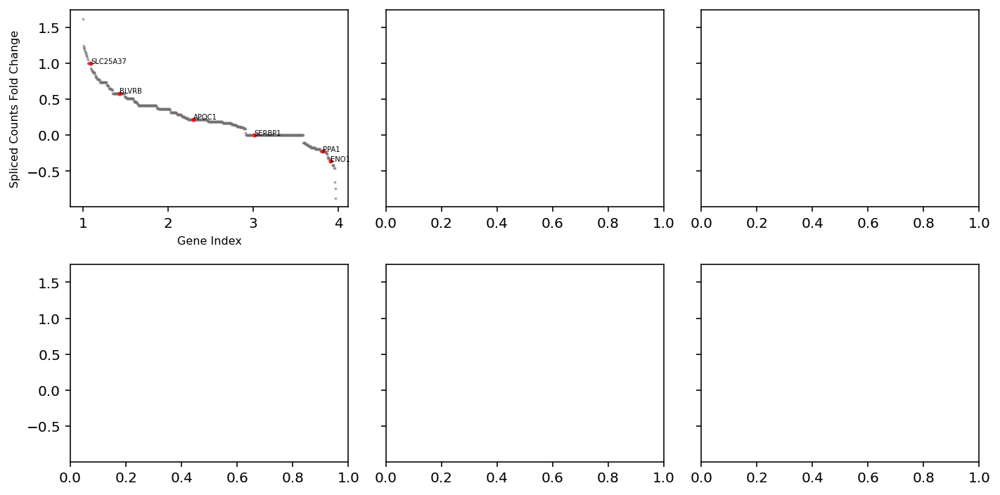

In [55]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5),sharey=True)
nbin=30

i=0
for j in range(1):


#     ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#         res2.best_phys_params[filt,j],
#         err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    x1 = range(z.shape[0])
    y1 = spliceFC
    
    indices = np.argsort(np.array(y1))[::-1]
    
    #x1 = np.array(x1)[indices]
    y1 = spliceFC[indices]
    
    sortNames = np.array(remainAll)[indices]

    ax1[i,j].scatter(x1,np.log2(10**y1),color=col_gray,alpha=alf_fail,s=ms_fail)

    #filtNames = np.array(hus_res.gene_names)[filt]
    nameFilt = [list(sortNames).index(n) for n in remainAllSub]
    n = remainAllSub
    for p, txt in enumerate(n):
        ax1[i,j].annotate(txt, (sortNames.tolist().index(txt),np.log2(10**y1[nameFilt][p])),
                         fontsize=5)
        
        ax1[i,j].scatter(sortNames.tolist().index(txt),np.log2(10**y1[nameFilt][p]),color='red',alpha=0.7,s=5)



    fs=14
    sml=8

    ax1[i,j].set_xlabel('Gene Index',fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Spliced Counts Fold Change',fontsize=sml)
        
    ax1[i,j].set_xticklabels(x1)

    


fig1.tight_layout()
fig1.show()

**Print genes that have highest deltas in parameters and S counts**

In [ ]:
#Print gene

In [56]:
gNames = []
for i in range(3):
    indices = np.argsort(np.array(z[:,i]))[::-1]
    gNames += [np.array(remainAll)[indices]]


indicesSplice = np.argsort(np.array(spliceFC))[::-1]
gNames += [np.array(remainAll)[indicesSplice]]

In [57]:
for i in gNames:
    print(i[0:50])

['SOD2' 'PPA2' 'JAK1' 'STK40' 'PNPT1' 'WASHC1' 'KMT2E' 'ZNF595' 'PTPN11'
 'TM9SF2' 'DCAF7' 'SEC31A' 'SLC25A37' 'NUP133' 'HIRA' 'CFLAR' 'SELENOF'
 'AATF' 'NOP58' 'TAF15' 'PARVB' 'POM121C' 'ZNF292' 'TRIP12' 'ALG8' 'NET1'
 'ELOVL5' 'NAA50' 'GALNT1' 'TESC' 'AGO3' 'KCMF1' 'SRP54' 'SMAP2' 'XRN2'
 'NUP155' 'KHDRBS1' 'TET1' 'APLP2' 'TNPO3' 'EIF4E' 'XIAP' 'PPP4R2' 'MED15'
 'KLHL8' 'ERI3' 'FAM20B' 'RDX' 'RNF216' 'PHIP']
['PPA2' 'SOD2' 'JAK1' 'STK40' 'PNPT1' 'PTPN11' 'TM9SF2' 'KMT2E' 'NUP133'
 'NOP58' 'DCAF7' 'TRIP12' 'TAF15' 'SEC31A' 'GALNT1' 'NAA50' 'KCMF1' 'AATF'
 'ZNF595' 'ELOVL5' 'XRN2' 'HIRA' 'SELENOF' 'AGO3' 'PARVB' 'ALG8' 'NUP155'
 'ZNF292' 'WASHC1' 'TNPO3' 'KHDRBS1' 'CFLAR' 'APLP2' 'LMNB1' 'EIF4E'
 'KLHL8' 'POM121C' 'EIF3M' 'PPP4R2' 'SUPT16H' 'SMAP2' 'SLC25A37' 'ERI3'
 'RNF216' 'ECPAS' 'PHIP' 'KIAA0232' 'GCN1' 'SRSF10' 'CCT5']
['SOD2' 'PPA2' 'JAK1' 'PTPN11' 'PNPT1' 'SEC31A' 'STK40' 'TM9SF2' 'NOP58'
 'KMT2E' 'TAF15' 'SELENOF' 'AATF' 'NUP133' 'DCAF7' 'NAA50' 'WASHC1'
 'GALNT1' 'TRIP12' 'HI

In [102]:
for i in gNames[0:-1]:
    print(set(i[0:50]).intersection(gNames[-1][0:50]))

{'RNF216', 'TET1', 'RDX', 'TESC', 'SLC25A37', 'ELOVL5', 'STK40', 'ALG8', 'NET1', 'FAM20B', 'PPA2', 'AGO3'}
{'RNF216', 'SLC25A37', 'ELOVL5', 'STK40', 'ALG8', 'PPA2', 'AGO3'}
{'TESC', 'STK40', 'ELOVL5', 'ALG8', 'NET1', 'PPA2'}


In [40]:
remainAllSub 

array(['APOC1', 'SERBP1', 'SLC25A37', 'ENO1', 'PPA1', 'BLVRB'],
      dtype='<U10')

In [130]:
genes = ['SLC25A37','BLVRB','ENO1','FAM20B','NET1','TCF4','AC079801.1','TOP2A']

In [131]:
#allPreds
#allTrues
#allNames

#err_mat
#err_true

In [132]:
#Make dataframe with gene_name, log2FC, log2(delta) for each param

#spliceFC


style = []
values = []

names = []
for g in genes:
    
    ind = remainAll.index(g)
    ind2 = [i for i in range(len(allNames)) if allNames[i] == g]

    values += list(allPreds[ind2,0])+list(allPreds[ind2,1])+list(allPreds[ind2,2])+[np.log2(10**spliceFC[ind])]*len(ind2)
    style += ['b']*len(ind2)+['beta']*len(ind2)+['gamma']*len(ind2)+['expr']*len(ind2)
    

    
    names += [g]*len(ind2)*4
    

df = pd.DataFrame()

df['name'] = names
df['category'] = style
df['values'] = values





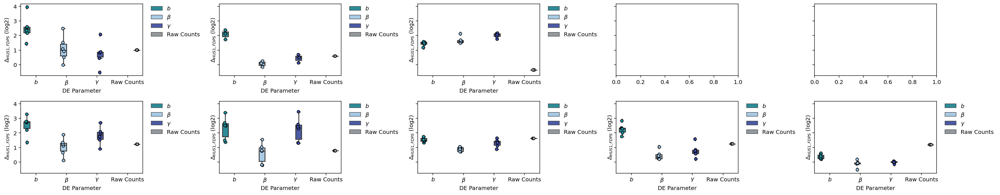

In [154]:
#Barplot of Spliced count , b , beta, gamma
palette={'b':'#1B9AAA','beta':'#9fcbee','gamma':'#3C50B1','expr':'#9299A0'}

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=5,figsize=(25,5),sharey=True)
nbin=30


for j in range(len(genes[0:3])):

    dfsub = df[df['name'].isin([genes[j]])]
    

    sns.boxplot(x="category", y="values", hue="category", palette=palette,
                data=dfsub,ax=ax1[0,j],dodge=True)
    
 
    sns.stripplot(x="category", y="values", hue="category", data=dfsub, palette=palette,
                  dodge=True, ax=ax1[0,j], ec='k', linewidth=1)

    
    handles, labels = ax1[0,j].get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    l = ax1[0,j].legend(handles[0:4], [r'$b$', r'$\beta$', r'$\gamma$', 'Raw Counts'], frameon=False,
                        bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    ax1[0,j].set_xticklabels([r'$b$', r'$\beta$', r'$\gamma$', 'Raw Counts'])
    ax1[0,j].set_xlabel('DE Parameter')
    ax1[0,j].set_ylabel(r'$\Delta_{HUS1,FDPS}$ (log2)')
    
for j in range(0,len(genes)-3):

    dfsub = df[df['name'].isin([genes[j+3]])]
    

    sns.boxplot(x="category", y="values", hue="category",palette=palette,
                data=dfsub,ax=ax1[1,j],dodge=True)
    
 
    sns.stripplot(x="category", y="values", hue="category", palette=palette,
                  data=dfsub, dodge=True, ax=ax1[1,j], ec='k', linewidth=1)

    
    handles, labels = ax1[1,j].get_legend_handles_labels()

    # When creating the legend, only use the first two elements
    # to effectively remove the last two.
    l = ax1[1,j].legend(handles[0:4], [r'$b$', r'$\beta$', r'$\gamma$', 'Raw Counts'], frameon=False,
                        bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    ax1[1,j].set_xticklabels([r'$b$', r'$\beta$', r'$\gamma$', 'Raw Counts'])
    ax1[1,j].set_xlabel('DE Parameter')
    ax1[1,j].set_ylabel(r'$\Delta_{HUS1,FDPS}$ (log2)')

    
fig1.tight_layout()
fig1.savefig('deGenes.pdf')

In [138]:
labels[0:4]

['b', 'beta', 'gamma', 'expr']

### **Check prediction of controls (negative control test)**

In [63]:
hus_res = results[0]
sg_res = results[7]
both_res = results[4]
ctrl_res = results[3]

#Filtered for genes shared by all samples
forFilt = [hus_res,sg_res,both_res,ctrl_res]


remain1 = np.array(forFilt[0].gene_names)[~forFilt[0].gene_rej & ~check_at_bounds(forFilt[0],forFilt[0].best_phys_params)] #~forFilt[0].gene_rej &
remainAll = remain1
#remain1 = remain1[pd.Categorical(remain1).isin(names)]

filts = []
for i in forFilt[1:]:

    remain2 = np.array(i.gene_names)[~i.gene_rej & ~check_at_bounds(i,i.best_phys_params)] #~i.gene_rej & 
    #remain2 = remain2[pd.Categorical(remain2).isin(names)]

    remainAll = list(set(remainAll).intersection(remain2))

for i in range(len(forFilt)):
    filts += [[forFilt[i].gene_names.index(x) for x in remainAll]]

#Get only DE genes from study
remainAllSub = np.array(remainAll)[pd.Categorical(remainAll).isin(names)]


filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[forFilt[i].gene_names.index(x) for x in remainAllSub]]

    
        

#Fit model for all params and plot FC correlations to fit data

#MODEL

z = (hus_res.best_phys_params[filts[0],:] - ctrl_res.best_phys_params[filts[3],:]) + (sg_res.best_phys_params[filts[1],:] - ctrl_res.best_phys_params[filts[3],:])

#Get previously fit parameter vaues,'ground truth'
true = (both_res.best_phys_params[filts[2],:] - ctrl_res.best_phys_params[filts[3],:])

In [64]:

#MODEL

z_sub = (hus_res.best_phys_params[filtsSub[0],:] - ctrl_res.best_phys_params[filtsSub[3],:]) + (sg_res.best_phys_params[filtsSub[1],:] - ctrl_res.best_phys_params[filtsSub[3],:])

#Get previously fit parameter vaues,'ground truth'
true_sub = (both_res.best_phys_params[filtsSub[2],:] - ctrl_res.best_phys_params[filtsSub[3],:])


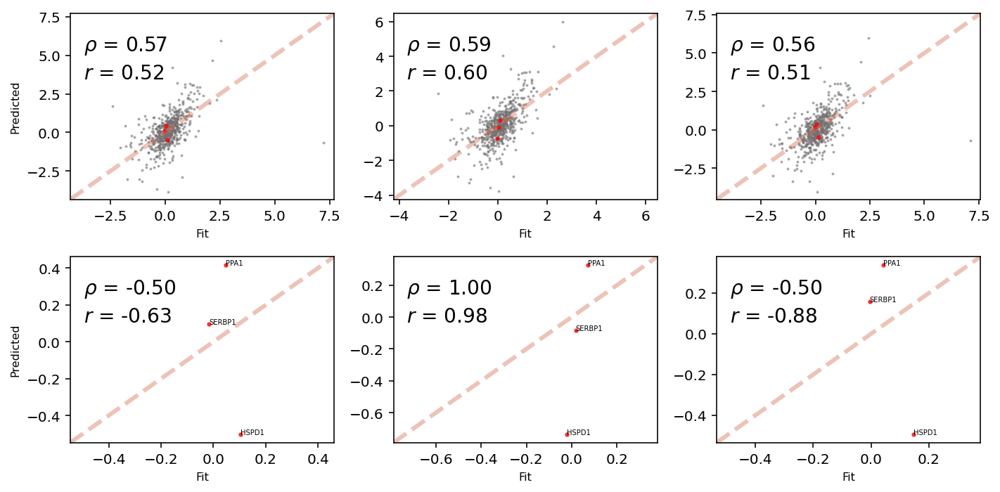

In [65]:
#PLOT WHERE ALL CONDITIONS ARE CONTROL CONDITIONS 

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30


#err for Fit params = sqrt(2)*err.sigma

i=0
for j in range(3):


# ------- ADD ERROR BARS -----------------

#     ax1[i,j].errorbar(true[:,j],z[:,j],
#         errsAll[:,j],errsAll[:,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    ax1[i,j].scatter(np.log2(10**true[:,j]),np.log2(10**z[:,j]),color=col_gray,alpha=alf_fail,s=ms_fail)

    #filtNames = np.array(hus_res.gene_names)[filt]
    n = remainAllSub
    for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (z[filtDE,j][p],true[filtDE,j][p]),
#                          fontsize=5)
        
        ax1[i,j].scatter(np.log2(10**true_sub[p,j]),np.log2(10**z_sub[p,j]),color='red',alpha=0.7,s=5)


    #Get max limits
    maxY = max(ax1[i,j].get_ylim())
    maxX = max(ax1[i,j].get_xlim())

    minY = min(ax1[i,j].get_ylim())
    minX = min(ax1[i,j].get_xlim())

    plotMax = max([maxY,maxX])
    plotMin = min([minY,minX])

    ax1[i,j].set_xlim([plotMin,plotMax])
    ax1[i,j].set_ylim([plotMin,plotMax])

    fs=14
    sml=8
    rho,pvals=stats.spearmanr(np.log2(10**z[:,j]),np.log2(10**true[:,j]))
    pr = np.corrcoef(np.log2(10**z[:,j]),np.log2(10**true[:,j]))[0][1]
    xl = ax1[i,j].get_xlim()
    ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)
    ax1[i,j].text(.05,0.65,r'$r$ = {:.2f}'.format(pr),fontsize=fs,transform=ax1[i,j].transAxes)
    
    
    #------ bottom plot -------
#     ax1[i+1,j].errorbar(true_sub[:,j],z_sub[:,j],
#         errsSub[:,j],errsSub[:,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)
    
    ax1[i+1,j].scatter(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]),color='red',alpha=0.7,s=5)
    
    #Get max limits
    maxY = max(ax1[i+1,j].get_ylim())
    maxX = max(ax1[i+1,j].get_xlim())

    minY = min(ax1[i+1,j].get_ylim())
    minX = min(ax1[i+1,j].get_xlim())

    plotMax = max([maxY,maxX])
    plotMin = min([minY,minX])

    ax1[i+1,j].set_xlim([plotMin,plotMax])
    ax1[i+1,j].set_ylim([plotMin,plotMax])
        
    
    fs=14
    sml=8
    rho,pvals=stats.spearmanr(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]))
    pr = np.corrcoef(np.log2(10**true_sub[:,j]),np.log2(10**z_sub[:,j]))[0][1] #DO SPEARMAN RANK CORRELATION
    xl = ax1[i+1,j].get_xlim()
    ax1[i+1,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i+1,j].set_xlabel('Fit',fontsize=sml)

    if j==0:
        ax1[i+1,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i+1,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i+1,j].transAxes)
    ax1[i+1,j].text(.05,0.65,r'$r$ = {:.2f}'.format(pr),fontsize=fs,transform=ax1[i+1,j].transAxes)
    
    n = remainAllSub
    for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (z[filtDE,j][p],true[filtDE,j][p]),
#                          fontsize=5)
        
        ax1[i+1,j].annotate(txt, (np.log2(10**true_sub[p,j]),np.log2(10**z_sub[p,j])),
                         fontsize=5)

    


fig1.tight_layout()
fig1.savefig('allPredCorrsNegControl.pdf')

### **Plot predicted parameter values vs control parameters**

Highlight known DE genes

In [142]:
#Param values are in log10

# #MODEL

# z = (hus_res.best_phys_params[filts[0],:] - ctrl_res.best_phys_params[filts[3],:]) + (sg_res.best_phys_params[filts[1],:] - ctrl_res.best_phys_params[filts[3],:])

# #Get previously fit parameter vaues,'ground truth'
# true = (both_res.best_phys_params[filts[2],:] - ctrl_res.best_phys_params[filts[3],:])

predParams = z + ctrl_res.best_phys_params[filts[3],:]

predParamsSub = z_sub + ctrl_res.best_phys_params[filtsSub[3],:]



In [144]:
trueParams = true + ctrl_res.best_phys_params[filts[3],:]

trueParamsSub = true_sub + ctrl_res.best_phys_params[filtsSub[3],:]


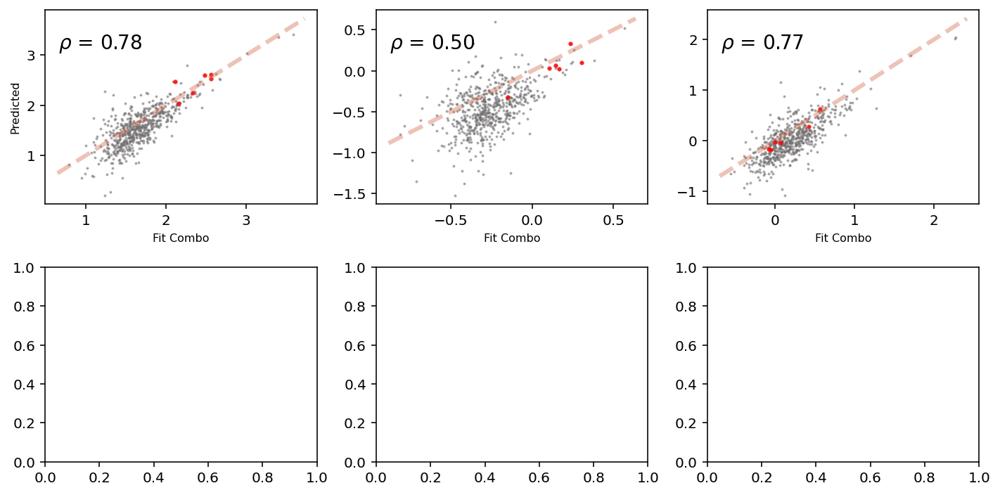

In [145]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30

i=0

for j in range(3):



#         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
#             res2.best_phys_params[filt,j],
#             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


    ax1[i,j].scatter(trueParams[:,j],predParams[:,j],color=col_gray,alpha=alf_fail,s=ms_fail)

#     filtNames = np.array(hus_res.gene_names)[filt]
#     n = filtNames[filtDE]

    ax1[i,j].scatter(trueParamsSub [:,j],predParamsSub[:,j],color='red',alpha=0.7,s=5)

#     for p, txt in enumerate(n):
#         ax1[i,j].annotate(txt, (physParams[filtDE,j][p],predParams[filtDE,j][p]),
#                          fontsize=5)



    fs=14
    sml=8
    rho=np.corrcoef(trueParams[:,j],predParams[:,j])[0][1]
    xl = ax1[i,j].get_xlim()
    ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
    ax1[i,j].set_xlabel(ns[i],fontsize=sml)

    if j==0:
        ax1[i,j].set_ylabel('Predicted',fontsize=sml)
    ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()

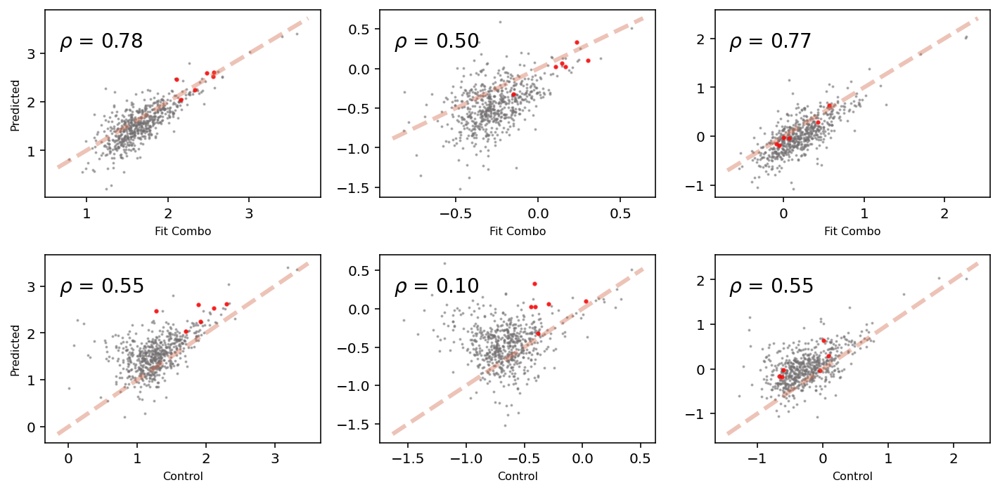

In [143]:

ms,lw,ms_fail,alf,alf_fail = sifig_aesth
fig1, ax1 = plt.subplots(nrows=2,ncols=3,figsize=(10,5))
nbin=30


res = [both_res,ctrl_res]
filtNum = [2,3]
ns = ['Fit Combo','Control']

for i in range(len(res)):
    r = res[i]
    num = filtNum[i]
    
    for j in range(3):
        


    #         ax1[i,j].errorbar(res1.best_phys_params[filt,j],
    #             res2.best_phys_params[filt,j],
    #             err1[filt,j],err2[filt,j],marker=markerstyle,ms=ms,c=col_gold,alpha=alf,linestyle='None',linewidth=lw,zorder=-100)


        ax1[i,j].scatter(r.best_phys_params[filts[num],j],predParams[:,j],color=col_gray,alpha=alf_fail,s=ms_fail)

    #     filtNames = np.array(hus_res.gene_names)[filt]
    #     n = filtNames[filtDE]

        ax1[i,j].scatter(r.best_phys_params[filtsSub[num],j],predParamsSub[:,j],color='red',alpha=0.7,s=5)
        
    #     for p, txt in enumerate(n):
    #         ax1[i,j].annotate(txt, (physParams[filtDE,j][p],predParams[filtDE,j][p]),
    #                          fontsize=5)



        fs=14
        sml=8
        rho=np.corrcoef(r.best_phys_params[filts[num],j],predParams[:,j])[0][1]
        xl = ax1[i,j].get_xlim()
        ax1[i,j].plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)
        ax1[i,j].set_xlabel(ns[i],fontsize=sml)

        if j==0:
            ax1[i,j].set_ylabel('Predicted',fontsize=sml)
        ax1[i,j].text(.05,.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=fs,transform=ax1[i,j].transAxes)

fig1.tight_layout()
fig1.show()

### **Burst size**

In [141]:
len(remainAll)

595

In [142]:
#Get only DE genes from study
remainAllSub = np.array(remainAll)[pd.Categorical(remainAll).isin(names)]

In [71]:
#MODEL

z = (hus_res.best_phys_params[filts[0],0] - ctrl_res.best_phys_params[filts[3],0]) + (sg_res.best_phys_params[filts[1],0] - ctrl_res.best_phys_params[filts[3],0])



In [72]:
true = (both_res.best_phys_params[filts[2],0] - ctrl_res.best_phys_params[filts[3],0])

In [75]:
z.shape

(704,)

In [76]:
true.shape

(704,)

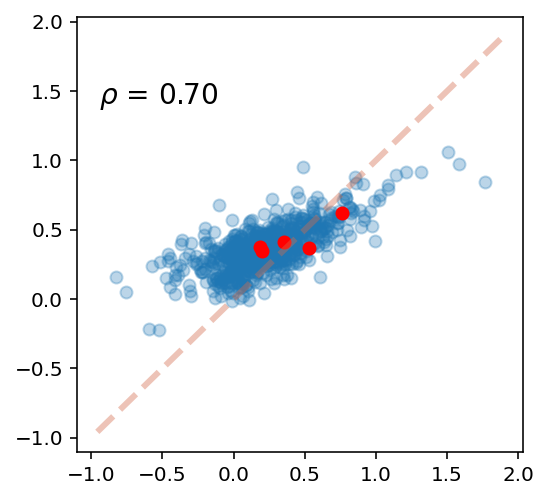

In [73]:
rho=np.corrcoef(z,true)[0][1]



fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true,alpha=0.3)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

ax.scatter(z[pd.Categorical(remainAll).isin(names)],true[pd.Categorical(remainAll).isin(names)],color='red')



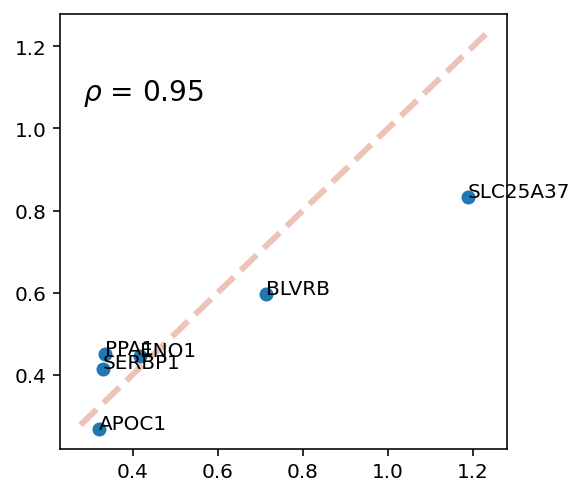

In [146]:



filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[forFilt[i].gene_names.index(x) for x in remainAllSub]]


#MODEL

z = (hus_res.best_phys_params[filtsSub[0],0] - ctrl_res.best_phys_params[filtsSub[3],0]) + (sg_res.best_phys_params[filtsSub[1],0] - ctrl_res.best_phys_params[filtsSub[3],0])


true = (both_res.best_phys_params[filtsSub[2],0] - ctrl_res.best_phys_params[filtsSub[3],0])

rho=np.corrcoef(z,true)[0][1]

fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

n = remainAllSub
for p, txt in enumerate(n):
    ax.annotate(txt, (z[p],true[p]),fontsize=10)

In [122]:
ctrl_res.best_phys_params[filtsSub[3],0]

array([1.98054204, 2.19258892, 1.49147085, 1.78368989])

In [123]:
remainAllSub

array(['SERBP1', 'APOC1', 'SLC25A37', 'PPA1'], dtype='<U10')

In [131]:
ctrl_res.best_phys_params[filtsSub[3],0]

array([2.2238125 , 2.09795342, 1.92375064, 1.71679364])

In [132]:
remainAllSub

array(['APOC1', 'ENO1', 'BLVRB', 'PPA1'], dtype='<U10')

### **Transcription rate**

In [243]:
# hus_res = results[9]
# sg_res = results[4]
# both_res = results[5]
# ctrl_res = results[0]
# filt = ~hus_res.gene_rej & ~sg_res.gene_rej & ~both_res.gene_rej & ~ctrl_res.gene_rej \
#         & ~check_at_bounds(hus_res,hus_res.best_phys_params) \
#         & ~check_at_bounds(sg_res,sg_res.best_phys_params) \
#         & ~check_at_bounds(both_res,both_res.best_phys_params) \
#         & ~check_at_bounds(ctrl_res,ctrl_res.best_phys_params) #pd.Categorical(hus_res.gene_names).isin(gnames) \

In [89]:
#MODEL

z = (hus_res.best_phys_params[filts[0],1] - ctrl_res.best_phys_params[filts[3],1]) + (sg_res.best_phys_params[filts[1],1] - ctrl_res.best_phys_params[filts[3],1])

true = (both_res.best_phys_params[filts[2],1] - ctrl_res.best_phys_params[filts[3],1])

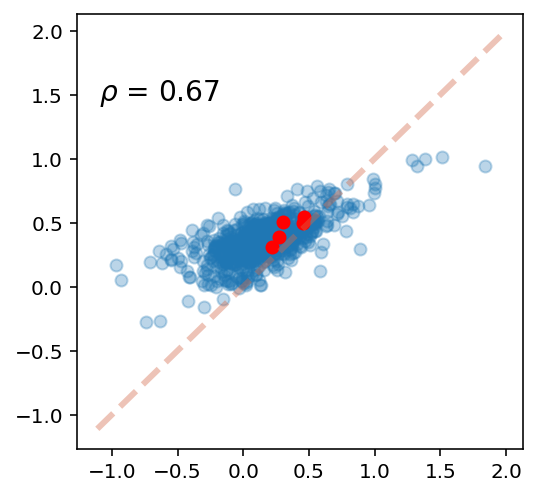

In [90]:
rho=np.corrcoef(z,true)[0][1]



fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true,alpha=0.3)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

ax.scatter(z[pd.Categorical(remainAll).isin(names)],true[pd.Categorical(remainAll).isin(names)],color='red')


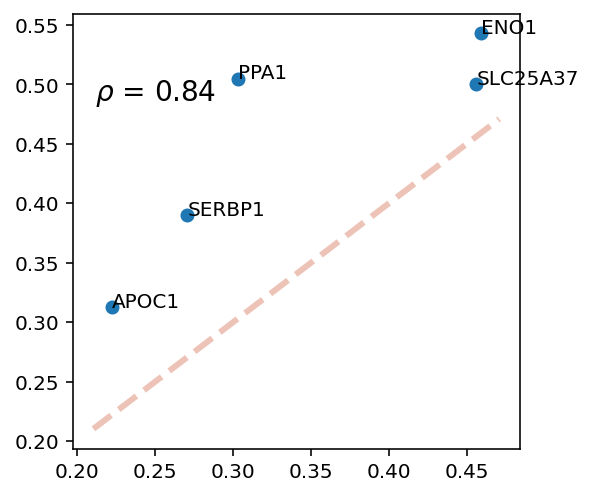

In [91]:



filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[forFilt[i].gene_names.index(x) for x in remainAllSub]]


#MODEL

z = (hus_res.best_phys_params[filtsSub[0],1] - ctrl_res.best_phys_params[filtsSub[3],1]) + (sg_res.best_phys_params[filtsSub[1],1] - ctrl_res.best_phys_params[filtsSub[3],1])


true = (both_res.best_phys_params[filtsSub[2],1] - ctrl_res.best_phys_params[filtsSub[3],1])

rho=np.corrcoef(z,true)[0][1]

fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

n = remainAllSub
for p, txt in enumerate(n):
    ax.annotate(txt, (z[p],true[p]),fontsize=10)

### **Degradation rate**

In [92]:
#MODEL

z = (hus_res.best_phys_params[filts[0],2] - ctrl_res.best_phys_params[filts[3],2]) + (sg_res.best_phys_params[filts[1],2] - ctrl_res.best_phys_params[filts[3],2])

true = (both_res.best_phys_params[filts[2],2] - ctrl_res.best_phys_params[filts[3],2])

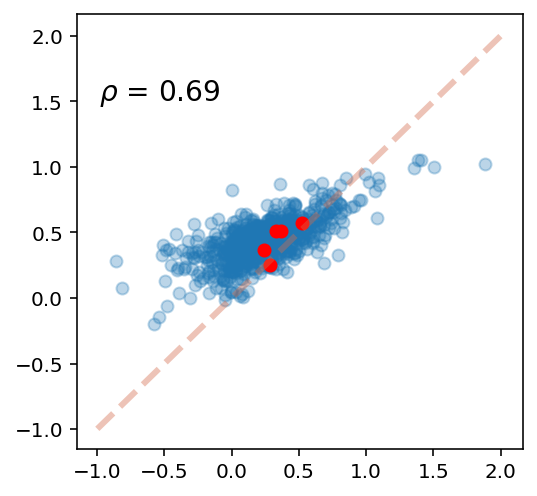

In [93]:
rho=np.corrcoef(z,true)[0][1]



fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true,alpha=0.3)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

ax.scatter(z[pd.Categorical(remainAll).isin(names)],true[pd.Categorical(remainAll).isin(names)],color='red')


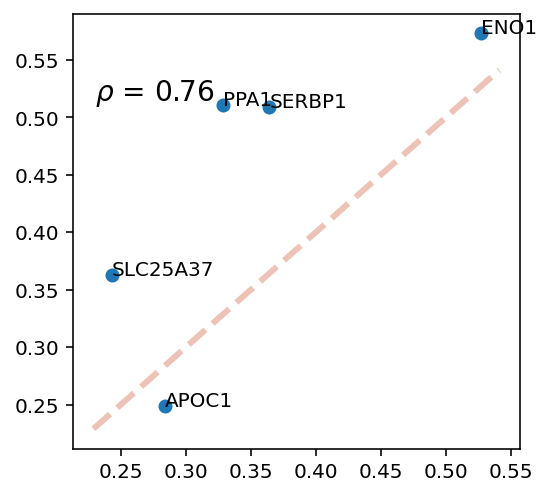

In [94]:



filtsSub = []
for i in range(len(forFilt)):
    filtsSub += [[forFilt[i].gene_names.index(x) for x in remainAllSub]]


#MODEL

z = (hus_res.best_phys_params[filtsSub[0],2] - ctrl_res.best_phys_params[filtsSub[3],2]) + (sg_res.best_phys_params[filtsSub[1],2] - ctrl_res.best_phys_params[filtsSub[3],2])


true = (both_res.best_phys_params[filtsSub[2],2] - ctrl_res.best_phys_params[filtsSub[3],2])

rho=np.corrcoef(z,true)[0][1]

fig,ax=plt.subplots(1, 1, figsize=(4,4))
ax.text(.05,0.8,r'$\rho$ = {:.2f}'.format(rho),fontsize=14,transform=ax.transAxes)
ax.scatter(z,true)
xl = ax.get_xlim()
ax.plot(xl,xl,'--',color=c_highlight,linewidth=3,alpha=0.4)

n = remainAllSub
for p, txt in enumerate(n):
    ax.annotate(txt, (z[p],true[p]),fontsize=10)